# OpenClassrooms - parcours Data Analyst Business Intelligence - P8

# Milestone 1 - Analyse des données

In [3]:
#On importe les librairies que nous utiliserons pour traiter les données et les visualiser
import pandas as pd, numpy as np, seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Option panda format numérique
pd.options.display.float_format = '{:,.0f}'.format

## 1.Type des données

### A. Dataset Historique

In [6]:
# Import historique immobilier Paris
df_historique = pd.read_excel("Excel/historique_immobilier_paris_2017_2021_vdef2.xlsx")

In [7]:
#Afficher les dimensions du dataset historique
print("Le tableau comporte {} observation(s) ou article(s)".format(df_historique.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_historique.shape[1]))
print()

#La nature des données historique dans chacune des colonnes
nature_des_donnees_historique = df_historique.dtypes
print("Nature des données de chaque colonne :")
print(nature_des_donnees_historique)
print()


Le tableau comporte 26196 observation(s) ou article(s)
Le tableau comporte 9 colonne(s)

Nature des données de chaque colonne :
date_mutation       datetime64[ns]
valeur_fonciere            float64
adresse_numero               int64
adresse_nom_voie            object
code_postal                  int64
nom_commune                 object
code_type_local              int64
type_local                  object
surface_reelle               int64
dtype: object



In [8]:
#On vérifie que le type des données attribué par pandas est cohérent
df_historique.head()

,date_mutation,valeur_fonciere,adresse_numero,adresse_nom_voie,code_postal,nom_commune,code_type_local,type_local,surface_reelle
0,2017-01-03,"550,560",8,RUE DES COUTURES SAINT GERVAIS,75003,Paris 3e Arrondissement,2,Appartement,50
1,2017-01-12,"1,576,492",32,AV MARCEAU,75008,Paris 8e Arrondissement,2,Appartement,163
2,2017-01-10,"657,757",52,RUE DU FAUBOURG SAINT HONORE,75008,Paris 8e Arrondissement,2,Appartement,66
3,2017-01-10,"250,087",64,RUE DU VERTBOIS,75003,Paris 3e Arrondissement,2,Appartement,22
4,2017-01-13,"176,267",25,RUE DES LAVANDIERES STE OPPORT,75001,Paris 1er Arrondissement,2,Appartement,15


In [9]:
#Le nombre de valeurs présentes dans chacune des colonnes
nombre_de_valeurs_historique = df_historique.count()
print("Nombre de valeurs présentes dans chaque colonne :")
print(nombre_de_valeurs_historique)
print()

# le nombre de valeurs nulles
df_historique.isnull().sum()

Nombre de valeurs présentes dans chaque colonne :
date_mutation       26196
valeur_fonciere     26196
adresse_numero      26196
adresse_nom_voie    26196
code_postal         26196
nom_commune         26196
code_type_local     26196
type_local          26196
surface_reelle      26196
dtype: int64



date_mutation       0
valeur_fonciere     0
adresse_numero      0
adresse_nom_voie    0
code_postal         0
nom_commune         0
code_type_local     0
type_local          0
surface_reelle      0
dtype: int64

In [10]:
#Nombre de caractéristiques
for col in df_historique.columns:
    print(f"Occurrences des valeurs uniques dans la colonne '{col}':")
    print(df_historique[col].value_counts(dropna=False))  # dropna=False pour inclure les NaN
print()

Occurrences des valeurs uniques dans la colonne 'date_mutation':
date_mutation
2019-12-20    61
2017-06-30    55
2021-06-30    55
2018-12-21    50
2021-09-30    49
              ..
2020-10-31     1
2018-12-24     1
2018-11-24     1
2020-02-23     1
2018-11-02     1
Name: count, Length: 1356, dtype: int64
Occurrences des valeurs uniques dans la colonne 'valeur_fonciere':
valeur_fonciere
268,730      2
167,071      2
855,145      2
325,301      2
277,392      2
            ..
1,847,968    1
251,725      1
668,068      1
714,417      1
369,429      1
Name: count, Length: 26120, dtype: int64
Occurrences des valeurs uniques dans la colonne 'adresse_numero':
adresse_numero
5      766
8      731
6      726
4      722
3      720
      ... 
405      1
274      1
326      1
285      1
377      1
Name: count, Length: 341, dtype: int64
Occurrences des valeurs uniques dans la colonne 'adresse_nom_voie':
adresse_nom_voie
RUE DE VAUGIRARD              137
RUE DES PYRENEES              123
RUE DE CHAR

In [11]:
# Statistique descriptif pour les transactions
df_historique.describe()

,date_mutation,valeur_fonciere,adresse_numero,code_postal,code_type_local,surface_reelle
count,26196,"26,196","26,196","26,196","26,196","26,196"
mean,2019-06-09 14:09:14.099862784,"491,617",47,"75,013",2,47
min,2017-01-02 00:00:00,"85,195",1,"75,001",2,11
25%,2018-03-14 00:00:00,"233,944",10,"75,009",2,23
50%,2019-05-23 00:00:00,"354,577",27,"75,014",2,35
75%,2020-09-16 00:00:00,"570,220",63,"75,017",2,55
max,2021-12-31 00:00:00,"38,433,590",407,"75,020",4,"3,945"
std,NaN,"571,329",56,5,1,52


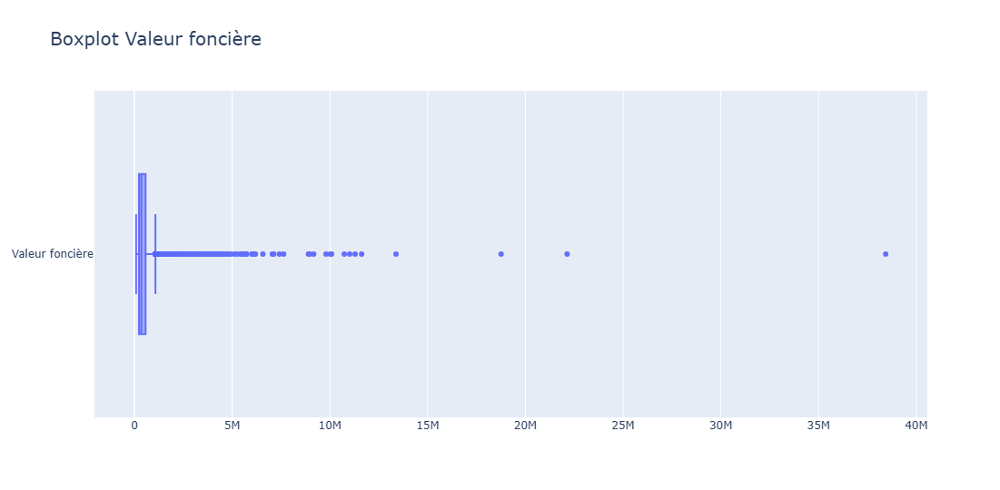

In [12]:
# Boxplot Valeur foncière
import plotly.graph_objects as go
import numpy as np

fig = go.Figure()

fig.add_trace(go.Box(x=df_historique['valeur_fonciere'], name="Valeur foncière"))

fig.update_layout(
    title="Boxplot Valeur foncière",
    width=1150,
    height=540,
    title_font=dict(size=20)
)
fig.show()

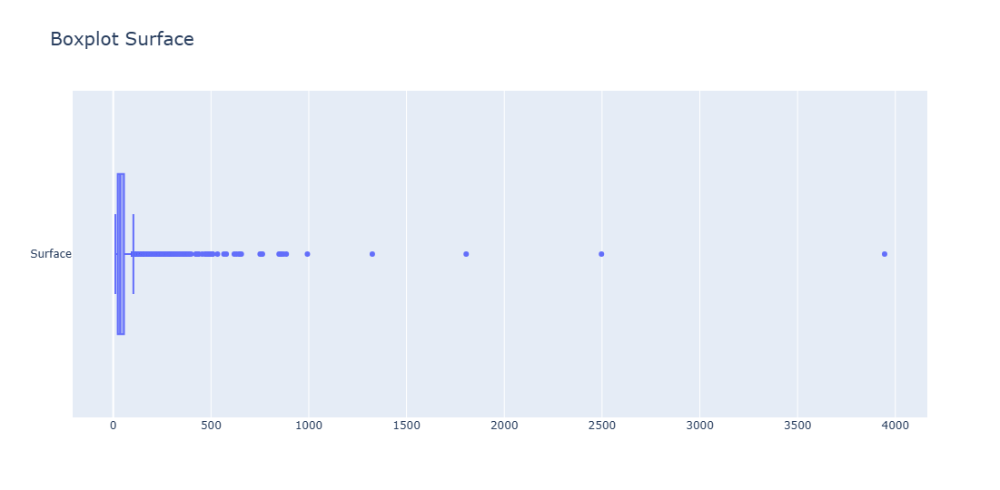

In [13]:
# Boxplot Surface
fig = go.Figure()

fig.add_trace(go.Box(x=df_historique['surface_reelle'], name="Surface"))

fig.update_layout(
    title="Boxplot Surface",
    width=1150,
    height=540,
    title_font=dict(size=20)
)
fig.show()

### B. Dataset Actif

In [15]:
# Import portefeuille actif
df_actif = pd.read_excel("Excel/portefeuille_actifs+(3).xlsx")

In [16]:
#Afficher les dimensions du dataset
print("Le tableau comporte {} observation(s) ou article(s)".format(df_actif.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_actif.shape[1]))
print()

#La nature des données dans chacune des colonnes
nature_des_donnees_actif = df_actif.dtypes
print("Nature des données de chaque colonne :")
print(nature_des_donnees_actif)
print()

Le tableau comporte 275 observation(s) ou article(s)
Le tableau comporte 12 colonne(s)

Nature des données de chaque colonne :
adresse_numero                 int64
adresse_nom_voie              object
code_postal                    int64
code_commune                   int64
nom_commune                   object
surface_carrez               float64
code_type_local                int64
type_local                    object
surface_reelle_bati            int64
nombre_pieces_principales      int64
longitude                    float64
latitude                     float64
dtype: object



In [17]:
# On vérifie les données de df_actif
df_actif.head()

,adresse_numero,adresse_nom_voie,code_postal,code_commune,nom_commune,surface_carrez,code_type_local,type_local,surface_reelle_bati,nombre_pieces_principales,longitude,latitude
0,127,RUE SAINT-DENIS,75001,75101,Paris 1er Arrondissement,16,2,Appartement,25,1,2,49
1,62,RUE NOTRE-DAME DE NAZARETH,75003,75103,Paris 3e Arrondissement,20,2,Appartement,22,1,2,49
2,62,RUE DE TURENNE,75003,75103,Paris 3e Arrondissement,64,2,Appartement,65,3,2,49
3,32,AV GEORGE V,75008,75108,Paris 8e Arrondissement,63,2,Appartement,74,2,2,49
4,152,BD HAUSSMANN,75008,75108,Paris 8e Arrondissement,21,2,Appartement,22,1,2,49


In [18]:
#Le nombre de valeurs présentes dans chacune des colonnes
nombre_de_valeurs_actif = df_actif.count()
print("Nombre de valeurs présentes dans chaque colonne :")
print(nombre_de_valeurs_actif)
print()

# le nombre de valeurs nulles
df_actif.isnull().sum()

Nombre de valeurs présentes dans chaque colonne :
adresse_numero               275
adresse_nom_voie             275
code_postal                  275
code_commune                 275
nom_commune                  275
surface_carrez               275
code_type_local              275
type_local                   275
surface_reelle_bati          275
nombre_pieces_principales    275
longitude                    275
latitude                     275
dtype: int64



adresse_numero               0
adresse_nom_voie             0
code_postal                  0
code_commune                 0
nom_commune                  0
surface_carrez               0
code_type_local              0
type_local                   0
surface_reelle_bati          0
nombre_pieces_principales    0
longitude                    0
latitude                     0
dtype: int64

In [19]:
#Nombre de caractéristiques
for col in df_actif.columns:
    print(f"Occurrences des valeurs uniques dans la colonne '{col}':")
    print(df_actif[col].value_counts(dropna=False))  # dropna=False pour inclure les NaN
print()

Occurrences des valeurs uniques dans la colonne 'adresse_numero':
adresse_numero
32     26
42     18
52     14
3      12
62     11
       ..
226     1
132     1
182     1
208     1
115     1
Name: count, Length: 72, dtype: int64
Occurrences des valeurs uniques dans la colonne 'adresse_nom_voie':
adresse_nom_voie
RUE DU FBG ST MARTIN      6
AV DE FLANDRE             5
RUE MARCADET              5
RUE D ABOUKIR             5
BD VOLTAIRE               4
                         ..
RUE AMELOT                1
RUE CROZATIER             1
AV DU GAL MICHEL BIZOT    1
BD RASPAIL                1
RUE AUBRIOT               1
Name: count, Length: 184, dtype: int64
Occurrences des valeurs uniques dans la colonne 'code_postal':
code_postal
75018    34
75017    32
75010    27
75003    23
75019    18
75020    17
75008    15
75012    14
75016    14
75002    12
75011    12
75014    11
75009    11
75015     9
75013     8
75006     7
75001     5
75005     3
75007     2
75004     1
Name: count, dtype: int6

In [20]:
# Statistique descriptif pour les actifs
df_actif.describe()

,adresse_numero,code_postal,code_commune,surface_carrez,code_type_local,surface_reelle_bati,nombre_pieces_principales,longitude,latitude
count,275,275,275,275,275,275,275,275,275
mean,77,"75,012","75,112",45,3,51,1,2,49
std,64,6,6,38,1,40,1,0,0
min,1,"75,001","75,101",5,2,11,0,2,49
25%,21,"75,009","75,109",22,2,26,0,2,49
50%,62,"75,013","75,113",35,2,39,1,2,49
75%,123,"75,018","75,118",53,4,58,2,2,49
max,252,"75,020","75,120",283,4,286,5,2,49


### C. Dataset Echantillon

In [22]:
# Import jeux test classification predictive
df_echantillon = pd.read_excel("Excel/echantillon_a_classer2.xlsx")

In [23]:
# On vérifie les données des echantillons
df_echantillon.head()

,valeur_fonciere,code_postal,nom_commune,surface_reelle
0,"868,687",75019,Paris 19e Arrondissement,88
1,"452,051",75019,Paris 19e Arrondissement,45
2,"193,089",75019,Paris 19e Arrondissement,21
3,"303,013",75019,Paris 19e Arrondissement,32
4,"149,272",75019,Paris 19e Arrondissement,20


In [24]:
#Afficher les dimensions du dataset
print("Le tableau comporte {} observation(s) ou article(s)".format(df_echantillon.shape[0]))
print("Le tableau comporte {} colonne(s)".format(df_echantillon.shape[1]))
print()

#La nature des données dans chacune des colonnes
nature_des_donnees_echantillon = df_echantillon.dtypes
print("Nature des données de chaque colonne :")
print(nature_des_donnees_echantillon)
print()

Le tableau comporte 40 observation(s) ou article(s)
Le tableau comporte 4 colonne(s)

Nature des données de chaque colonne :
valeur_fonciere    float64
code_postal          int64
nom_commune         object
surface_reelle       int64
dtype: object



In [25]:
#Le nombre de valeurs présentes dans chacune des colonnes
nombre_de_valeurs_echantillon = df_echantillon.count()
print("Nombre de valeurs présentes dans chaque colonne :")
print(nombre_de_valeurs_echantillon)
print()

# le nombre de valeurs nulles
df_echantillon.isnull().sum()

Nombre de valeurs présentes dans chaque colonne :
valeur_fonciere    40
code_postal        40
nom_commune        40
surface_reelle     40
dtype: int64



valeur_fonciere    0
code_postal        0
nom_commune        0
surface_reelle     0
dtype: int64

In [26]:
#Nombre de caractéristiques
for col in df_echantillon.columns:
    print(f"Occurrences des valeurs uniques dans la colonne '{col}':")
    print(df_echantillon[col].value_counts(dropna=False))  # dropna=False pour inclure les NaN
print()

Occurrences des valeurs uniques dans la colonne 'valeur_fonciere':
valeur_fonciere
868,687    1
452,051    1
588,958    1
483,462    1
177,582    1
255,738    1
298,834    1
333,404    1
537,467    1
129,430    1
457,532    1
191,652    1
991,093    1
113,656    1
160,472    1
456,119    1
194,311    1
379,199    1
628,966    1
252,253    1
256,290    1
269,985    1
403,670    1
193,089    1
303,013    1
149,272    1
179,676    1
241,857    1
462,982    1
518,820    1
374,523    1
249,470    1
371,205    1
188,199    1
384,909    1
323,116    1
299,838    1
385,609    1
985,005    1
938,063    1
Name: count, dtype: int64
Occurrences des valeurs uniques dans la colonne 'code_postal':
code_postal
75019    40
Name: count, dtype: int64
Occurrences des valeurs uniques dans la colonne 'nom_commune':
nom_commune
Paris 19e Arrondissement    40
Name: count, dtype: int64
Occurrences des valeurs uniques dans la colonne 'surface_reelle':
surface_reelle
35    3
25    3
63    3
39    2
53    2
50   

In [27]:
# Statistique descriptif pour les echantillons
df_echantillon.describe()

,valeur_fonciere,code_postal,surface_reelle
count,40,40,40
mean,"385,736","75,019",44
std,"229,324",0,23
min,"113,656","75,019",15
25%,"229,970","75,019",25
50%,"328,260","75,019",39
75%,"458,894","75,019",54
max,"991,093","75,019",99


## 2. Regardons les différents types de biens immobiliers que nous avons dans nos données :

### A. Dataset Historique

In [30]:
# Nb valeurs par type de bien Historique
print('Dataset Transactions:\n')
print(df_historique['type_local'].value_counts(dropna=False))

Dataset Transactions:

type_local
Appartement                                 24353
Local industriel. commercial ou assimilé     1843
Name: count, dtype: int64


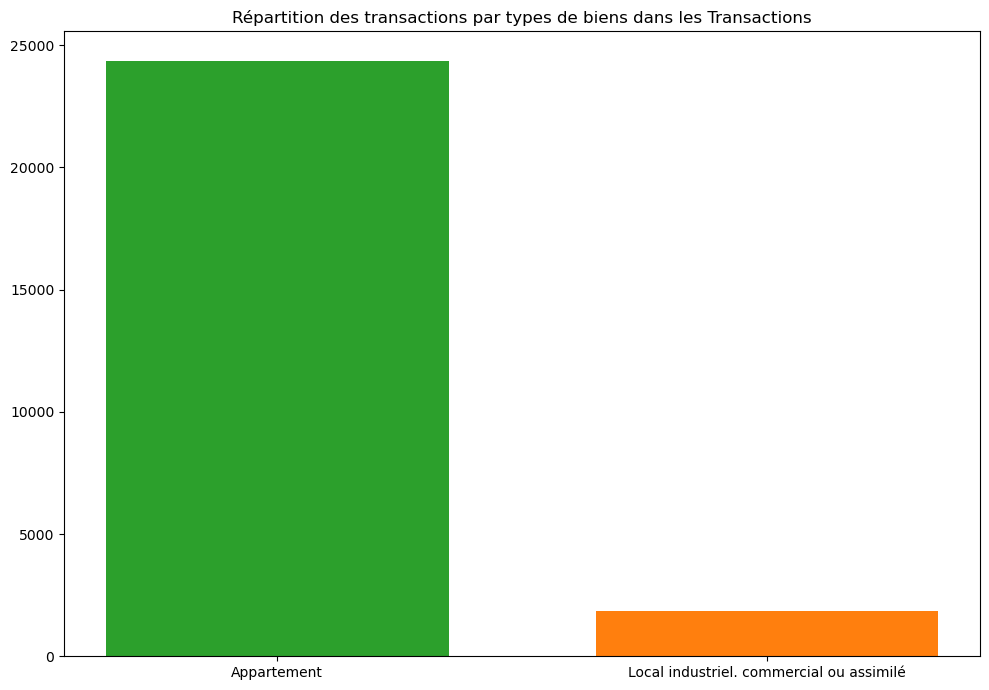

In [31]:
## Graphique répartition des types de biens pour les Transactions effectuées
import matplotlib.pyplot as plt

# Label type de biens
x = df_historique['type_local'].unique()

# Valeur type de biens
y = df_historique['type_local'].value_counts(dropna=False)

# Couleurs
bar_colors = ['tab:green', 'tab:orange']

# Création de l'histogramme
plt.figure(figsize=(10, 7))
plt.bar(x, y, width=0.7, align='center',color=bar_colors)


# Ajout des légendes et titres
plt.title('Répartition des transactions par types de biens dans les Transactions')

# Affichage du graphique
plt.tight_layout()
plt.show()

### B. Dataset Actif

In [33]:
# Nb valeurs par type de bien Actif
print('Dataset Actifs:\n')
print(df_actif['type_local'].value_counts(dropna=False))
print()


Dataset Actifs:

type_local
Appartement                                 154
Local industriel. commercial ou assimilé    121
Name: count, dtype: int64



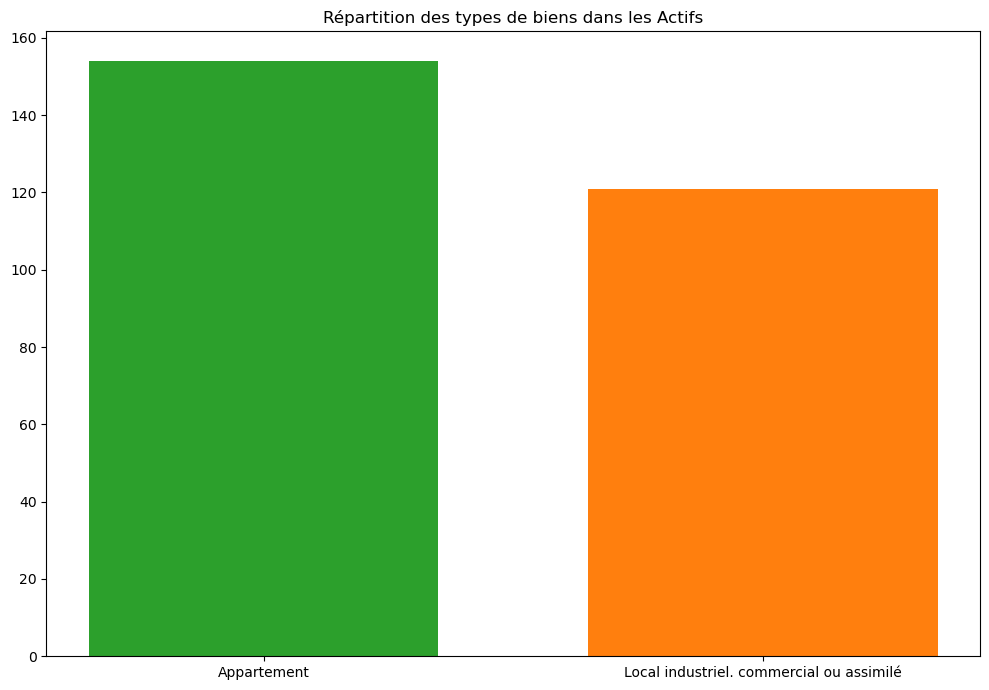

In [34]:
## Graphique répartition des types de biens pour les Actifs
import matplotlib.pyplot as plt

# Label type de biens
x = df_actif['type_local'].unique()

# Valeur type de biens
y = df_actif['type_local'].value_counts(dropna=False)

# Couleurs
bar_colors = ['tab:green', 'tab:orange']

# Création de l'histogramme
plt.figure(figsize=(10, 7))
plt.bar(x, y, width=0.7, align='center', color=bar_colors)

# Ajout des légendes et titres
plt.title('Répartition des types de biens dans les Actifs')

# Affichage du graphique
plt.tight_layout()
plt.show()

### C. Code associé au Type de Local

In [36]:
# Code type de bien associé au type de bien
valeurs_uniques = {
    "code_type_local": df_actif['code_type_local'].unique(),
    "type_local": df_actif['type_local'].unique(),
}
# On créé un dataframe uniquement avec les codes et types de bien
df_valeurs_uniques = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in valeurs_uniques.items()]))

print('Code et Type de bien :\n')
print(df_valeurs_uniques)

Code et Type de bien :

   code_type_local                                type_local
0                2                               Appartement
1                4  Local industriel. commercial ou assimilé


## 3. Nombre de transactions

### A. Chiffres

In [39]:
#On retire les colonnes qui sont à priori inutiles ET nous allons nous concentrer sur les appartements dans un premier temps
colonnes_a_conserver = ['date_mutation','valeur_fonciere','code_postal','code_type_local','type_local','surface_reelle']

# Dataframe Transaction
df_transaction = df_historique[colonnes_a_conserver].copy()

In [40]:
#On verifie le nombre de transactions que nous avons dans notre dataframe
nb_transaction = df_transaction.shape[0]
print(f'le nombre de transactions dans les données est de: {nb_transaction}')

le nombre de transactions dans les données est de: 26196


In [41]:
#On verifie le nombre de transactions que nous avons dans notre dataframe
transaction_apt =  df_transaction[df_transaction['type_local']=='Appartement']
print(f'le nombre de transactions pour les appartements dans les données est de: {transaction_apt.shape[0]}')

le nombre de transactions pour les appartements dans les données est de: 24353


In [42]:
#On verifie le nombre de transactions que nous avons dans notre dataframe
transaction_crp = df_transaction[df_transaction['type_local']=='Local industriel. commercial ou assimilé']
print(f'le nombre de transactions pour les locaux commerciaux dans les données est de: {transaction_crp.shape[0]}')

le nombre de transactions pour les locaux commerciaux dans les données est de: 1843


### B. Graphique

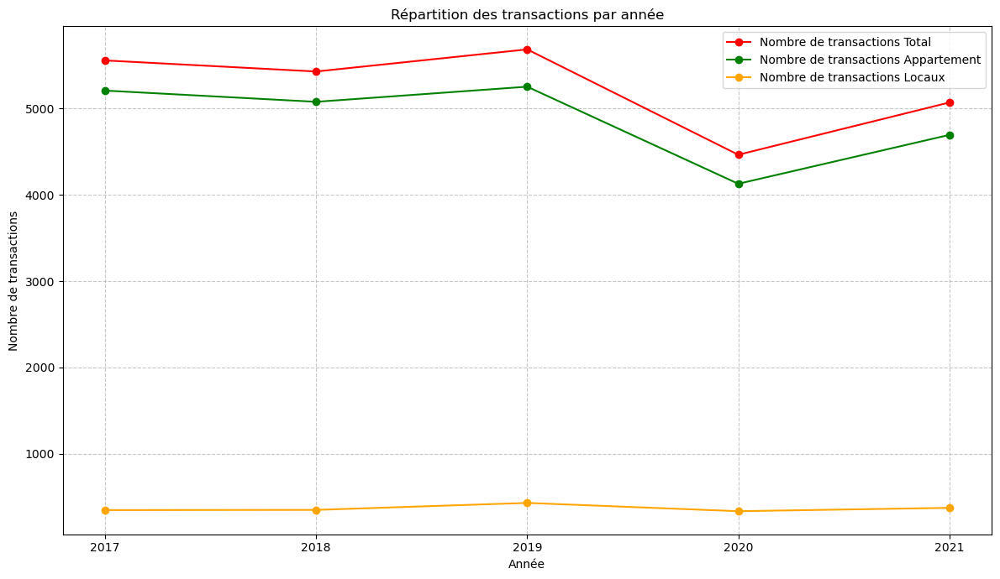

In [44]:

# Extraction de l'année à partir de la date_mutation
df_transaction['annee'] = df_transaction['date_mutation'].dt.year.astype(str)

# Comptage des transactions par année
transactions_par_annee = df_transaction['annee'].value_counts().sort_index()

# Compte le nb transaction par année pour les appartements
nb_transaction_apt_year = transaction_apt.groupby(transaction_apt['date_mutation'].dt.year.astype(str)).size().to_frame(name='nombre_transactions')

# Compte le nb transaction par année pour les locaux
nb_transaction_crp_year = transaction_crp.groupby(transaction_crp['date_mutation'].dt.year.astype(str)).size().to_frame(name='nombre_transactions')

# Création du graphique
plt.figure(figsize=(12, 7))
plt.plot(transactions_par_annee.index, transactions_par_annee.values, marker='o', linestyle='-', color='red', label='Nombre de transactions Total')
plt.plot(transactions_par_annee.index, nb_transaction_apt_year, marker='o', linestyle='-', color='green', label='Nombre de transactions Appartement')
plt.plot(transactions_par_annee.index, nb_transaction_crp_year, marker='o', linestyle='-', color='orange', label='Nombre de transactions Locaux')

# Ajout des légendes et titres
plt.xlabel('Année')
plt.ylabel('Nombre de transactions')
plt.title('Répartition des transactions par année')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

# Affichage du graphique
plt.tight_layout()
plt.show()

## 4. interval de l'historique des données

In [46]:
#On vérifie également la plage de l'historique disponible
first_date = df_transaction['date_mutation'].dt.date.min()
formatted_first_date = first_date.strftime('%d/%m/%Y')   # Formater la date

print(f'la première date de transaction dans les données est le: {formatted_first_date}')

la première date de transaction dans les données est le: 02/01/2017


In [47]:
#On vérifie également la plage de l'historique disponible
last_date = df_transaction['date_mutation'].dt.date.max()
formatted_last_date = last_date.strftime('%d/%m/%Y')   # Formater la date

print(f'la dernière date de transaction dans les données est le: {formatted_last_date}')

la dernière date de transaction dans les données est le: 31/12/2021


## 5. Evolution du prix au metre carré des appartements dans Paris

In [49]:
# Calcul du prix au mètre carré
df_transaction['prix_m2'] = round(df_transaction['valeur_fonciere']/df_transaction['surface_reelle'],2)
display(df_transaction)

,date_mutation,valeur_fonciere,code_postal,code_type_local,type_local,surface_reelle,annee,prix_m2
0,2017-01-03,"550,560",75003,2,Appartement,50,2017,"11,011"
1,2017-01-12,"1,576,492",75008,2,Appartement,163,2017,"9,672"
2,2017-01-10,"657,757",75008,2,Appartement,66,2017,"9,966"
3,2017-01-10,"250,087",75003,2,Appartement,22,2017,"11,368"
4,2017-01-13,"176,267",75001,2,Appartement,15,2017,"11,751"
...,...,...,...,...,...,...,...,...
26191,2021-02-25,"471,224",75004,2,Appartement,37,2021,"12,736"
26192,2021-02-17,"1,982,330",75002,4,Local industriel. commercial ou assimilé,150,2021,"13,216"
26193,2021-03-08,"312,436",75002,2,Appartement,26,2021,"12,017"
26194,2021-03-11,"156,223",75002,2,Appartement,13,2021,"12,017"


In [50]:
print(f"Prix m² Min : {df_transaction['prix_m2'].min()}\n")

print(f"Prix m² Moyen : {df_transaction['prix_m2'].mean():.2f}\n")

print(f"Prix m² Max : {df_transaction['prix_m2'].max()}\n")


Prix m² Min : 7196.49

Prix m² Moyen : 10325.99

Prix m² Max : 15547.8



In [51]:
df_transaction.describe()

,date_mutation,valeur_fonciere,code_postal,code_type_local,surface_reelle,prix_m2
count,26196,"26,196","26,196","26,196","26,196","26,196"
mean,2019-06-09 14:09:14.099862784,"491,617","75,013",2,47,"10,326"
min,2017-01-02 00:00:00,"85,195","75,001",2,11,"7,196"
25%,2018-03-14 00:00:00,"233,944","75,009",2,23,"9,321"
50%,2019-05-23 00:00:00,"354,577","75,014",2,35,"10,036"
75%,2020-09-16 00:00:00,"570,220","75,017",2,55,"10,941"
max,2021-12-31 00:00:00,"38,433,590","75,020",4,"3,945","15,548"
std,NaN,"571,329",5,1,52,"1,432"


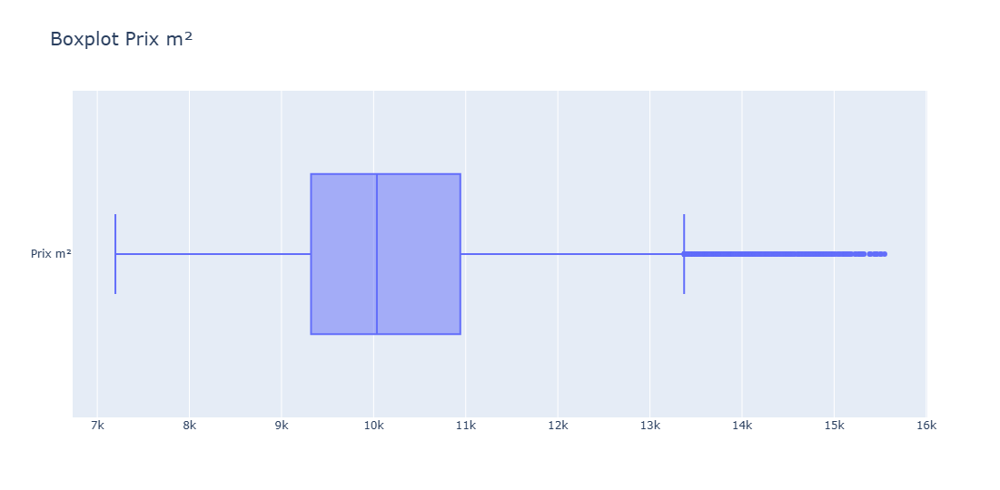

In [52]:
# Boxplot Prix m²
fig = go.Figure()

fig.add_trace(go.Box(x=df_transaction['prix_m2'], name="Prix m²"))

fig.update_layout(
    title="Boxplot Prix m²",
    width=1150,
    height=540,
    title_font=dict(size=20)
)
fig.show()

### A. Chiffres Appartements

In [54]:
###Préparons un dataframe en regroupant les prix moyens de ventes des appartements par année avec la surface moyenne associée

# Récupère les données des appartements
transaction_apt = df_transaction[df_transaction['code_type_local']==2].copy()

# Groupe prix m² par année
filtered_prix_transaction_apt = (
    transaction_apt.groupby(transaction_apt['date_mutation'].dt.year)
    .agg(
        prix_m2_mean=('prix_m2', 'mean'),
        prix_m2_min=('prix_m2', 'min'),
        prix_m2_max=('prix_m2', 'max')
    )
    .round(2)  # Arrondi des valeurs
    .reset_index()  # Réinitialise l'index pour inclure l'année comme colonne
)

print("Prix m² des Appartement/Année :")
display(filtered_prix_transaction_apt)

Prix m² des Appartement/Année :


,date_mutation,prix_m2_mean,prix_m2_min,prix_m2_max
0,2017,"9,493","7,196","13,545"
1,2018,"10,031","7,790","13,859"
2,2019,"10,563","8,393","14,015"
3,2020,"10,675","8,695","14,170"
4,2021,"10,456","8,611","14,167"


On constate que la moyenne des prix de vente des appartements à Paris croit jusqu'en 2020 puis décroit en 2021<br>
Nous allons créer un graphique pour mieux le visualiser.

### B. Graphique Appartements

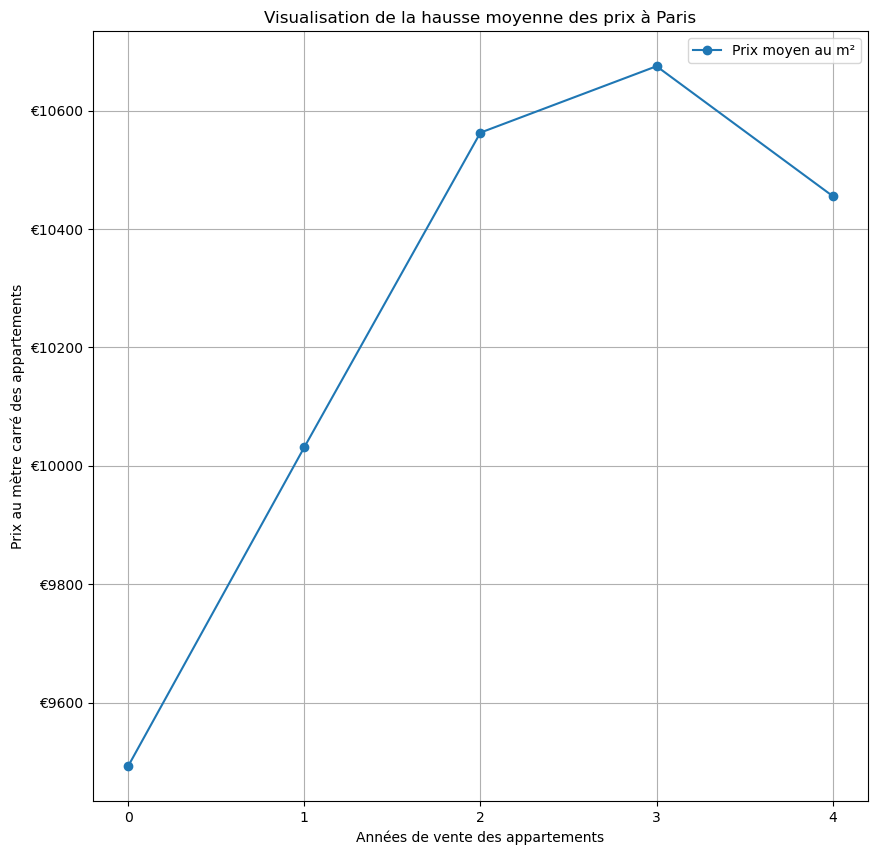

In [57]:

# Extraire les années (index) et les moyennes (valeurs)
annees = filtered_prix_transaction_apt.index.astype(str)  # Convertir les années en chaînes de caractères
moyennes = filtered_prix_transaction_apt['prix_m2_mean']

# Création du graphique
plt.figure(figsize=(10, 10))
plt.plot(annees, moyennes, marker='o', label='Prix moyen au m²')

# Configuration des axes
plt.xlabel('Années de vente des appartements')
plt.ylabel('Prix au mètre carré des appartements')
formatter = ticker.FormatStrFormatter('€%d')  # Format des prix
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid()
plt.title('Visualisation de la hausse moyenne des prix à Paris')
plt.legend()

# Affichage
plt.show()

## 6. Différences de prix au metre carré entre les arrondissements

In [59]:
#Liste des codes postaux dans nos données
arrondissement = transaction_apt['code_postal'].sort_values().unique()
print(arrondissement)

[75001 75002 75003 75004 75005 75006 75007 75008 75009 75010 75011 75012
 75013 75014 75015 75016 75017 75018 75019 75020]


In [60]:
# Groupe les prix moyens par code postal
filtered_mean_prix_transaction_apt_cp = transaction_apt.groupby( transaction_apt['code_postal']).agg({'prix_m2':'mean'}).round(2)

print("Prix m² moyen des Appartement/Arrondissement :")
display(filtered_mean_prix_transaction_apt_cp)

Prix m² moyen des Appartement/Arrondissement :


,prix_m2
code_postal,
75001,"12,834"
75002,"11,668"
75003,"12,466"
75004,"13,124"
75005,"12,295"
75006,"13,144"
75007,"12,649"
75008,"10,949"
75009,"10,477"


### A. Type de bien : Appartement

In [62]:

# Groupe les prix moyens par code postal et année
filtered_mean_prix_transaction_apt_cp = transaction_apt.groupby([transaction_apt['code_postal'],transaction_apt['date_mutation'].dt.year]).agg({'prix_m2':'mean'}).round(2)

# Réinitialiser l'index pour faciliter la transformation en tableau pivot
filtered_mean_prix_transaction_apt_cp = filtered_mean_prix_transaction_apt_cp.reset_index()

# Transformer en tableau avec pivot
tableau_pivot_apt = filtered_mean_prix_transaction_apt_cp.pivot(
    index='code_postal', 
    columns='date_mutation', 
    values='prix_m2'
)

# Calculer les pourcentages de changement d'une année à l'autre
tableau_pourcentage_apt = tableau_pivot_apt.pct_change(axis=1) * 100  # Convertir en pourcentage

# Remplace NaN par 0
tableau_pourcentage_apt = tableau_pourcentage_apt.fillna(0)

# Ajouter les pourcentages au tableau d'origine comme nouvelles colonnes
tableau_final_apt = pd.concat([tableau_pivot_apt, tableau_pourcentage_apt], axis=1, keys=['Prix_m2', 'Pourcentage'])

# Renommer les niveaux de colonnes pour plus de clarté
tableau_final_apt.columns.names = ['Type', 'Année']

# Afficher le tableau final
print("Prix m² moyen des Appartements et évolution entre année % / Arrondissement / Année :")
display(tableau_final_apt)

Prix m² moyen des Appartements et évolution entre année % / Arrondissement / Année :


Type        Prix_m2                             Pourcentage                 \
Année          2017   2018   2019   2020   2021        2017 2018 2019 2020   
code_postal                                                                  
75001        11,763 12,621 13,269 13,406 13,380           0    7    5    1   
75002        10,920 11,309 12,151 12,182 11,773           0    4    7    0   
75003        11,680 12,470 12,813 12,834 12,661           0    7    3    0   
75004        12,407 13,432 13,641 13,105 12,937           0    8    2   -4   
75005        11,307 12,056 12,928 12,960 12,606           0    7    7    0   
75006        12,509 12,896 13,378 13,807 13,795           0    3    4    3   
75007        11,845 12,553 12,922 13,110 13,118           0    6    3    1   
75008        10,133 10,631 11,195 11,703 11,710           0    5    5    5   
75009         9,582 10,187 10,958 10,981 10,732           0    6    8    0   
75010         8,747  9,328  9,999 10,200 10,043           0    7    7    2   
75011         9,138  9,689 10,377 10,533 10,352           0    6    7    2   
75012         8,455  8,938  9,498  9,691  9,658           0    6    6    2   
75013         8,345  8,755  9,340  9,334  9,165           0    5    7   -0   
75014         9,055  9,434 10,027 10,108  9,994           0    4    6    1   
75015         9,098  9,328  9,822 10,061  9,971           0    3    5    2   
75016         9,809 10,244 10,825 10,911 10,790           0    4    6    1   
75017         9,337  9,881 10,400 10,536 10,372           0    6    5    1   
75018         8,466  9,153  9,928  9,947  9,666           0    8    8    0   
75019         7,622  8,266  8,850  8,983  8,829           0    8    7    1   
75020         7,886  8,485  9,094  9,329  9,114           0    8    7    3   

Type              
Année       2021  
code_postal       
75001         -0  
75002         -3  
75003         -1  
75004         -1  
75005         -3  
75006         -0  
75007          0  
75008          0  
75009         -2  
75010         -2  
75011         -2  
75012         -0  
75013         -2  
75014         -1  
75015         -1  
75016         -1  
75017         -2  
75018         -3  
75019         -2  
75020         -2

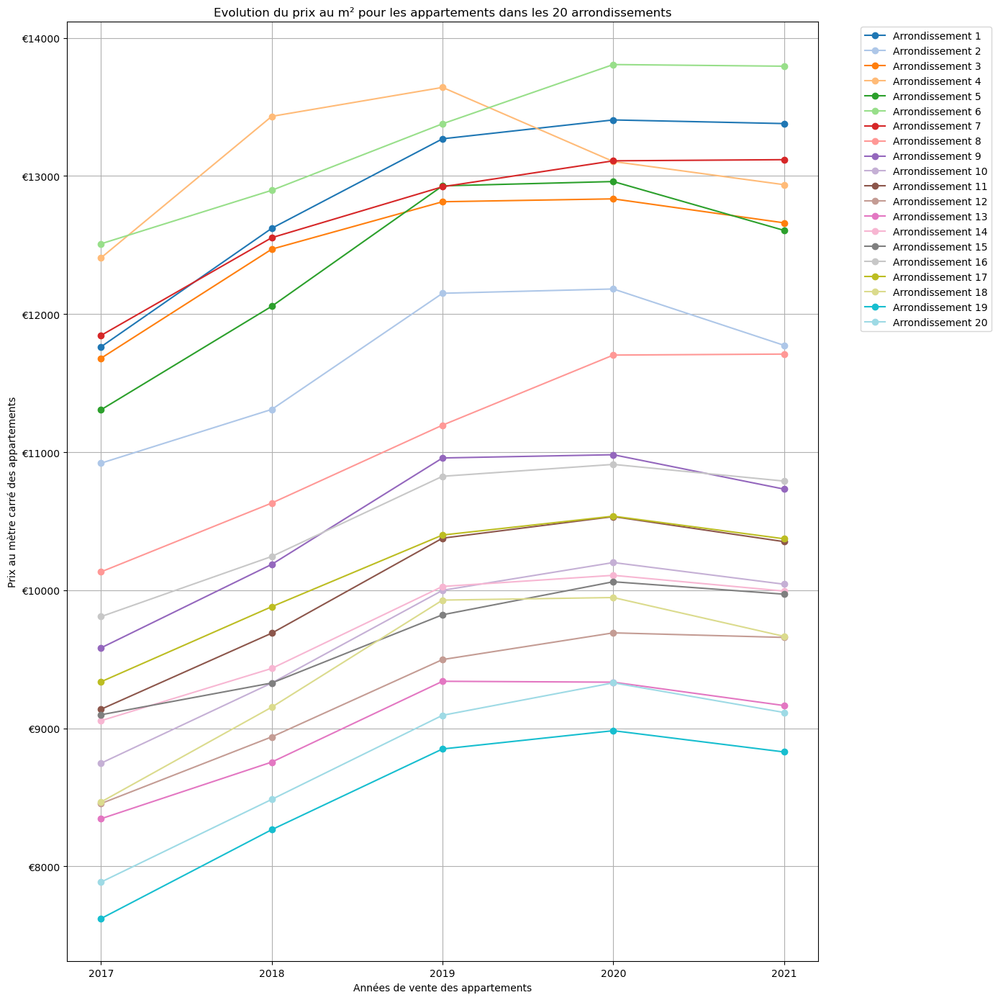

In [63]:

# Groupement par code_postal et année
prix_par_arrondissement = (
    transaction_apt.groupby([transaction_apt['code_postal'], transaction_apt['date_mutation'].dt.year.astype(str) ])
    .agg({'prix_m2': 'mean'})
    .round(2)
    .reset_index()
)

# Création du graphique
plt.figure(figsize=(14, 14))

# Générer une couleur différente pour chaque code postal
couleurs = plt.cm.tab20(np.linspace(0, 1, 20))  # Palette de 20 couleurs

for i, code_postal in enumerate(range(75001, 75021)):
    # Filtrer les données pour l'arrondissement courant
    data = prix_par_arrondissement[prix_par_arrondissement['code_postal'] == code_postal]
    
    # Extraire les années et les moyennes
    annees = data['date_mutation']
    moyennes = data['prix_m2']
    
    # Tracer la ligne pour cet arrondissement
    num_arrondissement = code_postal - 75000
    plt.plot(annees, moyennes, marker='o', label=f'Arrondissement {num_arrondissement}', color=couleurs[i])

# Configuration des axes
plt.xlabel('Années de vente des appartements')
plt.ylabel('Prix au mètre carré des appartements')
formatter = ticker.FormatStrFormatter('€%d')  # Format des prix
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid()
plt.title('Evolution du prix au m² pour les appartements dans les 20 arrondissements')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Affichage
plt.tight_layout()
plt.show()

### B. Type de bien : Locaux

In [65]:

# Récupère les données des corporate
transaction_crp = df_transaction[df_transaction['code_type_local']==4].copy()

filtered_mean_prix_transaction_crp_cp = transaction_crp.groupby(
    [transaction_crp['code_postal'], transaction_crp['date_mutation'].dt.year]
).agg({'prix_m2': 'mean'}).round(2)

# Réinitialiser l'index pour faciliter la transformation en tableau pivot
filtered_mean_prix_transaction_crp_cp = filtered_mean_prix_transaction_crp_cp.reset_index()

# Transformer en tableau avec pivot
tableau_pivot_crp = filtered_mean_prix_transaction_crp_cp.pivot(
    index='code_postal', 
    columns='date_mutation', 
    values='prix_m2'
)

# Calculer les pourcentages de changement d'une année à l'autre
tableau_pourcentage_crp = tableau_pivot_crp.pct_change(axis=1) * 100  # Convertir en pourcentage

# Remplace NaN par 0
tableau_pourcentage_crp = tableau_pourcentage_crp.fillna(0)

# Ajouter les pourcentages au tableau d'origine comme nouvelles colonnes
tableau_final_crp = pd.concat([tableau_pivot_crp, tableau_pourcentage_crp], axis=1, keys=['Prix_m2', 'Pourcentage'])

# Renommer les niveaux de colonnes pour plus de clarté
tableau_final_crp.columns.names = ['Type', 'Année']

# Afficher le tableau final

print("Prix m² moyen des Locaux et évolution entre année % / Arrondissement / Année :")
display(tableau_final_crp)

Prix m² moyen des Locaux et évolution entre année % / Arrondissement / Année :


Type        Prix_m2                             Pourcentage                 \
Année          2017   2018   2019   2020   2021        2017 2018 2019 2020   
code_postal                                                                  
75001        12,989 14,024 14,607 14,765 14,774           0    8    4    1   
75002        11,990 12,453 13,310 13,309 13,075           0    4    7   -0   
75003        12,904 13,686 13,984 14,098 13,940           0    6    2    1   
75004        13,678 14,958 15,135 14,396 14,184           0    9    1   -5   
75005        12,471 13,246 14,387 14,287 13,862           0    6    9   -1   
75006        13,699 14,243 14,934 15,171 15,159           0    4    5    2   
75007        13,041 13,939 14,216 14,551 14,520           0    7    2    2   
75008        11,248 11,650 12,382 12,877 12,775           0    4    6    4   
75009        10,571 11,195 12,157 12,102 11,848           0    6    9   -0   
75010         9,644 10,280 10,968 11,141 11,026           0    7    7    2   
75011        10,047 10,734 11,387 11,603 11,402           0    7    6    2   
75012         9,334  9,802 10,440 10,683 10,680           0    5    7    2   
75013         9,254  9,723 10,260 10,270 10,053           0    5    6    0   
75014         9,930 10,439 11,063 11,105 11,048           0    5    6    0   
75015        10,019 10,271 10,834 11,076 10,939           0    3    5    2   
75016        10,827 11,328 11,937 12,007 11,922           0    5    5    1   
75017        10,303 10,889 11,366 11,568 11,342           0    6    4    2   
75018         9,346 10,048 10,898 10,961 10,653           0    8    8    1   
75019         8,366  8,953  9,737  9,872  9,738           0    7    9    1   
75020         8,713  9,257 10,072 10,293  9,964           0    6    9    2   

Type              
Année       2021  
code_postal       
75001          0  
75002         -2  
75003         -1  
75004         -1  
75005         -3  
75006         -0  
75007         -0  
75008         -1  
75009         -2  
75010         -1  
75011         -2  
75012         -0  
75013         -2  
75014         -1  
75015         -1  
75016         -1  
75017         -2  
75018         -3  
75019         -1  
75020         -3

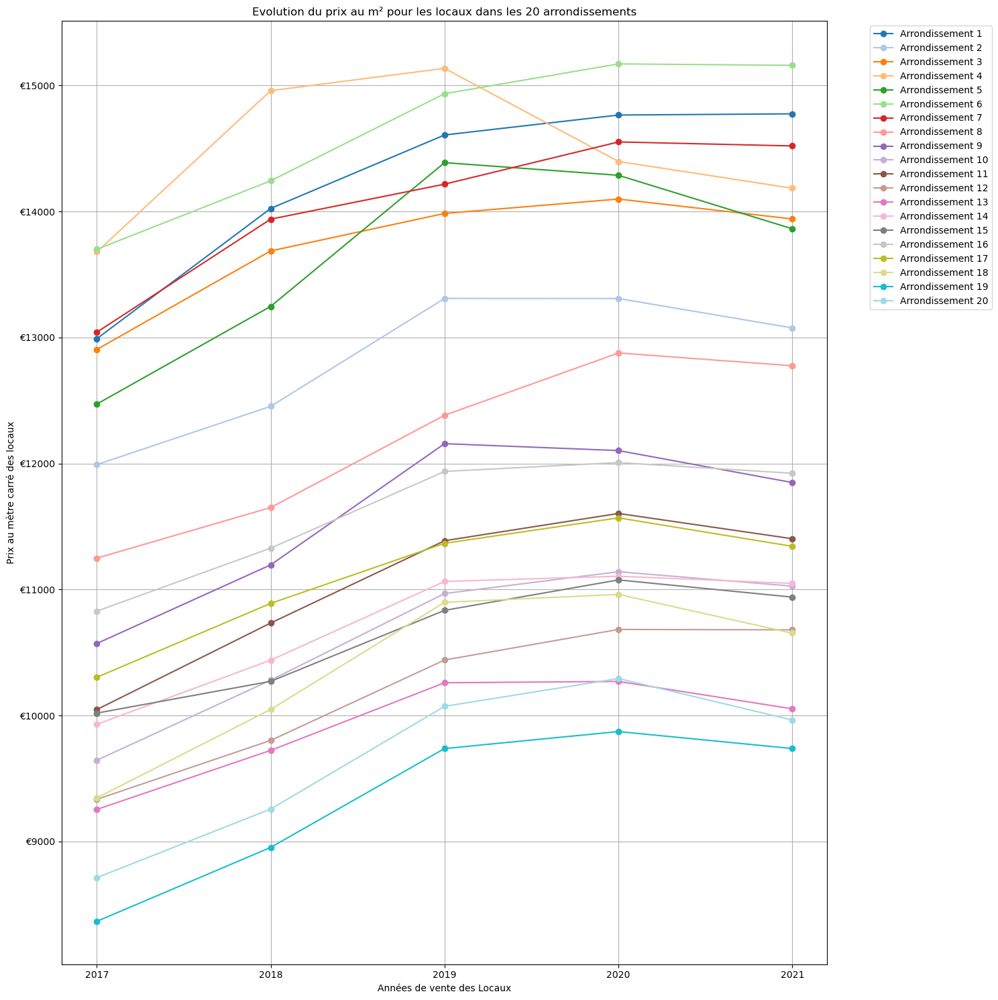

In [66]:

# Groupement par code_postal et année
prix_par_arrondissement = (
    transaction_crp.groupby([transaction_crp['code_postal'], transaction_crp['date_mutation'].dt.year.astype(str) ])
    .agg({'prix_m2': 'mean'})
    .round(2)
    .reset_index()
)

# Création du graphique
plt.figure(figsize=(15, 15))

# Générer une couleur différente pour chaque code postal
couleurs = plt.cm.tab20(np.linspace(0, 1, 20))  # Palette de 20 couleurs

for i, code_postal in enumerate(range(75001, 75021)):
    # Filtrer les données pour l'arrondissement courant
    data = prix_par_arrondissement[prix_par_arrondissement['code_postal'] == code_postal]
    
    # Extraire les années et les moyennes
    annees = data['date_mutation']
    moyennes = data['prix_m2']
    
    # Tracer la ligne pour cet arrondissement
    num_arrondissement = code_postal - 75000
    plt.plot(annees, moyennes, marker='o', label=f'Arrondissement {num_arrondissement}', color=couleurs[i])

# Configuration des axes
plt.xlabel('Années de vente des Locaux')
plt.ylabel('Prix au mètre carré des locaux')
formatter = ticker.FormatStrFormatter('€%d')  # Format des prix
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid()
plt.title('Evolution du prix au m² pour les locaux dans les 20 arrondissements')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Affichage
plt.tight_layout()
plt.show()

### C. Tout Type de Biens

In [68]:

filtered_mean_prix_transaction_cp = df_transaction.groupby(
    [df_transaction['code_postal'], df_transaction['date_mutation'].dt.year]
).agg({'prix_m2': 'mean'}).round(2)

# Réinitialiser l'index pour faciliter la transformation en tableau pivot
filtered_mean_prix_transaction_cp = filtered_mean_prix_transaction_cp.reset_index()

# Transformer en tableau avec pivot
tableau_pivot = filtered_mean_prix_transaction_cp.pivot(
    index='code_postal', 
    columns='date_mutation', 
    values='prix_m2'
)

# Calculer les pourcentages de changement d'une année à l'autre
tableau_pourcentage = tableau_pivot.pct_change(axis=1) * 100  # Convertir en pourcentage

# Remplace NaN par 0
tableau_pourcentage = tableau_pourcentage.fillna(0)

# Ajouter les pourcentages au tableau d'origine comme nouvelles colonnes
tableau_final = pd.concat([tableau_pivot, tableau_pourcentage], axis=1, keys=['Prix_m2', 'Pourcentage'])

# Renommer les niveaux de colonnes pour plus de clarté
tableau_final.columns.names = ['Type', 'Année']

# Afficher le tableau final

print("Prix m² moyen des biens et évolution entre année en % / Arrondissement / Année :")
display(tableau_final)

Prix m² moyen des biens et évolution entre année en % / Arrondissement / Année :


Type        Prix_m2                             Pourcentage                 \
Année          2017   2018   2019   2020   2021        2017 2018 2019 2020   
code_postal                                                                  
75001        11,922 12,818 13,459 13,462 13,603           0    8    5    0   
75002        11,004 11,408 12,300 12,263 11,888           0    4    8   -0   
75003        11,825 12,589 12,948 12,941 12,801           0    6    3   -0   
75004        12,463 13,527 13,758 13,210 13,049           0    9    2   -4   
75005        11,414 12,182 13,022 13,133 12,667           0    7    7    1   
75006        12,613 12,976 13,516 13,923 14,022           0    3    4    3   
75007        11,926 12,713 13,030 13,217 13,271           0    7    2    1   
75008        10,284 10,830 11,413 11,944 11,935           0    5    5    5   
75009         9,699 10,312 11,075 11,107 10,840           0    6    7    0   
75010         8,812  9,402 10,065 10,295 10,107           0    7    7    2   
75011         9,190  9,750 10,455 10,604 10,420           0    6    7    1   
75012         8,490  8,978  9,594  9,750  9,731           0    6    7    2   
75013         8,370  8,771  9,423  9,444  9,211           0    5    7    0   
75014         9,091  9,481 10,118 10,181 10,055           0    4    7    1   
75015         9,149  9,392  9,885 10,123 10,018           0    3    5    2   
75016         9,877 10,300 10,920 10,996 10,897           0    4    6    1   
75017         9,395  9,932 10,457 10,595 10,460           0    6    5    1   
75018         8,503  9,177  9,971 10,010  9,695           0    8    9    0   
75019         7,644  8,282  8,868  9,028  8,870           0    8    7    2   
75020         7,896  8,515  9,135  9,363  9,158           0    8    7    2   

Type              
Année       2021  
code_postal       
75001          1  
75002         -3  
75003         -1  
75004         -1  
75005         -4  
75006          1  
75007          0  
75008         -0  
75009         -2  
75010         -2  
75011         -2  
75012         -0  
75013         -2  
75014         -1  
75015         -1  
75016         -1  
75017         -1  
75018         -3  
75019         -2  
75020         -2

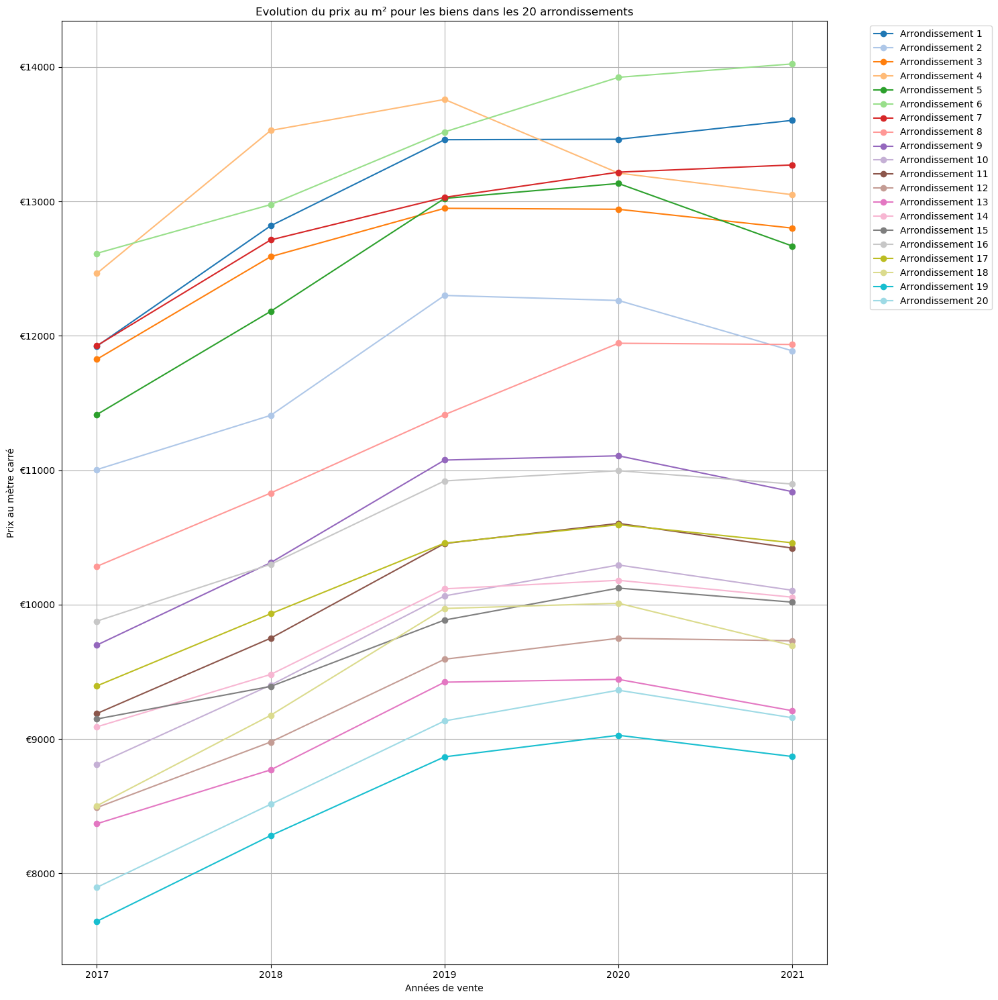

In [69]:

# Groupement par code_postal et année
prix_par_arrondissement = (
    df_transaction.groupby([df_transaction['code_postal'], df_transaction['date_mutation'].dt.year.astype(str) ])
    .agg({'prix_m2': 'mean'})
    .round(2)
    .reset_index()
)

# Création du graphique
plt.figure(figsize=(15, 15))

# Générer une couleur différente pour chaque code postal
couleurs = plt.cm.tab20(np.linspace(0, 1, 20))  # Palette de 20 couleurs

for i, code_postal in enumerate(range(75001, 75021)):
    # Filtrer les données pour l'arrondissement courant
    data = prix_par_arrondissement[prix_par_arrondissement['code_postal'] == code_postal]
    
    # Extraire les années et les moyennes
    annees = data['date_mutation']
    moyennes = data['prix_m2']
    
    # Tracer la ligne pour cet arrondissement
    num_arrondissement = code_postal - 75000
    plt.plot(annees, moyennes, marker='o', label=f'Arrondissement {num_arrondissement}', color=couleurs[i])

# Configuration des axes
plt.xlabel('Années de vente')
plt.ylabel('Prix au mètre carré')
formatter = ticker.FormatStrFormatter('€%d')  # Format des prix
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid()
plt.title('Evolution du prix au m² pour les biens dans les 20 arrondissements')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité

# Affichage
plt.tight_layout()
plt.show()

On observe que globalement que :
- la tendance est à une décroissance en 2021 pour presque l'ensemble des arrondissements après une croissante de 2017 à 2020 
- le 6e arrondissement est celui avec la plus forte valeur pour les appartements
- le 19e arrondissement est celui avec la plus faible valeur

## 7. Prix au metre carré par transaction dans un arrondissement

#### A. Chiffres Transaction 6e Arrondissement

In [73]:
#Vérifions le nombre de transaction dans le 6ème car le prix semble élevé
transaction6e = transaction_apt[transaction_apt['code_postal']==75006]
print(f"Le nombre de transaction dans le 6e est de : {transaction6e.shape[0]}")
print()

# Vérification de l'ensemble des arrondissement
for i, code_postal in enumerate(range(75001, 75021)):
    # Filtrer les données pour l'arrondissement courant
    data = transaction_apt[transaction_apt['code_postal'] == code_postal]
    
    arrondissement = code_postal - 75000
    print(f"Le nombre de transaction dans l'arrondissement {arrondissement} est de : {data.shape[0]}")
    
    # Grouper le nombre de transaction par année
    nb_transaction_apt_year = transaction_apt.groupby(data['date_mutation'].dt.year.astype(str)).size().to_frame(name='nombre_transactions')
    display(nb_transaction_apt_year)


Le nombre de transaction dans le 6e est de : 709

Le nombre de transaction dans l'arrondissement 1 est de : 409


,nombre_transactions
date_mutation,
2017,87
2018,98
2019,91
2020,70
2021,63


Le nombre de transaction dans l'arrondissement 2 est de : 666


,nombre_transactions
date_mutation,
2017,129
2018,138
2019,135
2020,129
2021,135


Le nombre de transaction dans l'arrondissement 3 est de : 784


,nombre_transactions
date_mutation,
2017,171
2018,176
2019,169
2020,130
2021,138


Le nombre de transaction dans l'arrondissement 4 est de : 548


,nombre_transactions
date_mutation,
2017,108
2018,120
2019,118
2020,101
2021,101


Le nombre de transaction dans l'arrondissement 5 est de : 829


,nombre_transactions
date_mutation,
2017,208
2018,170
2019,175
2020,140
2021,136


Le nombre de transaction dans l'arrondissement 6 est de : 709


,nombre_transactions
date_mutation,
2017,198
2018,175
2019,123
2020,108
2021,105


Le nombre de transaction dans l'arrondissement 7 est de : 607


,nombre_transactions
date_mutation,
2017,138
2018,138
2019,154
2020,87
2021,90


Le nombre de transaction dans l'arrondissement 8 est de : 628


,nombre_transactions
date_mutation,
2017,159
2018,140
2019,147
2020,85
2021,97


Le nombre de transaction dans l'arrondissement 9 est de : 969


,nombre_transactions
date_mutation,
2017,202
2018,184
2019,193
2020,166
2021,224


Le nombre de transaction dans l'arrondissement 10 est de : 1227


,nombre_transactions
date_mutation,
2017,258
2018,227
2019,260
2020,206
2021,276


Le nombre de transaction dans l'arrondissement 11 est de : 1932


,nombre_transactions
date_mutation,
2017,430
2018,401
2019,407
2020,323
2021,371


Le nombre de transaction dans l'arrondissement 12 est de : 1036


,nombre_transactions
date_mutation,
2017,242
2018,204
2019,220
2020,175
2021,195


Le nombre de transaction dans l'arrondissement 13 est de : 870


,nombre_transactions
date_mutation,
2017,177
2018,184
2019,192
2020,135
2021,182


Le nombre de transaction dans l'arrondissement 14 est de : 1248


,nombre_transactions
date_mutation,
2017,280
2018,265
2019,251
2020,227
2021,225


Le nombre de transaction dans l'arrondissement 15 est de : 2308


,nombre_transactions
date_mutation,
2017,491
2018,471
2019,511
2020,386
2021,449


Le nombre de transaction dans l'arrondissement 16 est de : 1947


,nombre_transactions
date_mutation,
2017,418
2018,427
2019,417
2020,320
2021,365


Le nombre de transaction dans l'arrondissement 17 est de : 2212


,nombre_transactions
date_mutation,
2017,452
2018,483
2019,473
2020,351
2021,453


Le nombre de transaction dans l'arrondissement 18 est de : 2805


,nombre_transactions
date_mutation,
2017,547
2018,541
2019,623
2020,511
2021,583


Le nombre de transaction dans l'arrondissement 19 est de : 1091


,nombre_transactions
date_mutation,
2017,197
2018,211
2019,249
2020,204
2021,230


Le nombre de transaction dans l'arrondissement 20 est de : 1528


,nombre_transactions
date_mutation,
2017,314
2018,323
2019,343
2020,273
2021,275


On constate que le nombre de transactions diminue pour le 6e

Affichons l'historique des transactions pour visualiser la dispersion des données :

#### B. Graphique Dispersion Transaction 6e Arrondissement

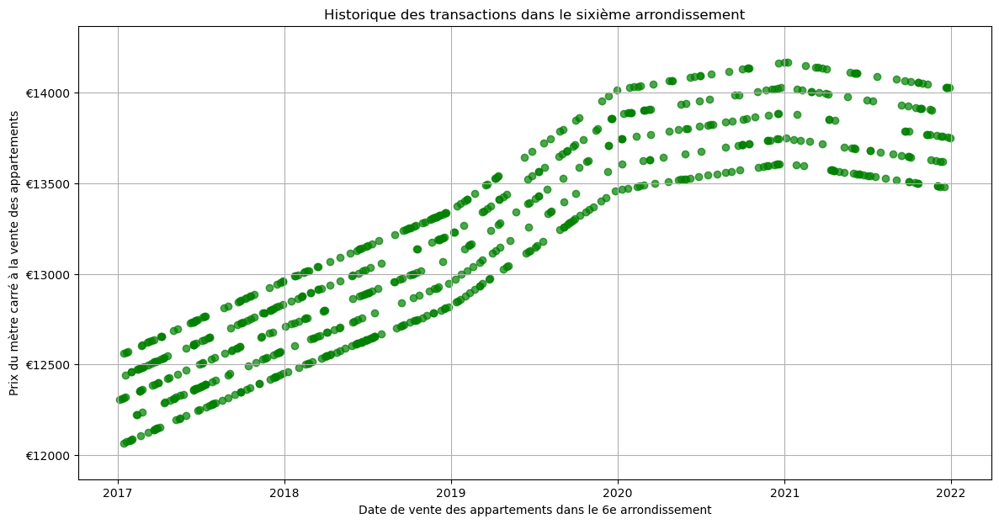

In [77]:
# Filtrer les données pour le 6e arrondissement
cp=75006
data_75006 = transaction_apt[transaction_apt['code_postal'] == cp].copy()

# Création du scatter plot
plt.figure(figsize=(14,7))

# Scatter plot : Date de vente vs Prix au m²
plt.scatter(data_75006['date_mutation'], data_75006['prix_m2'], alpha=0.7, label='Transactions', color='green')

# Configuration des axes
plt.xlabel('Date de vente des appartements dans le 6e arrondissement')
plt.ylabel('Prix du mètre carré à la vente des appartements')

# Formatage de l'axe des ordonnées
formatter = ticker.FormatStrFormatter('€%d')
plt.gca().yaxis.set_major_formatter(formatter)

# Limite des prix pour une meilleure lisibilité
plt.ylim(data_75006['prix_m2'].min() - 200, data_75006['prix_m2'].max() + 200)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both')
plt.title('Historique des transactions dans le sixième arrondissement')

plt.show()

On observe que le nombre de transaction pour le 6e arrondissement diminue au file des années

Pour nous rassurer sur la relation entre les données nous allons utiliser un test statistique de corrélation.

#### C. Corrélation

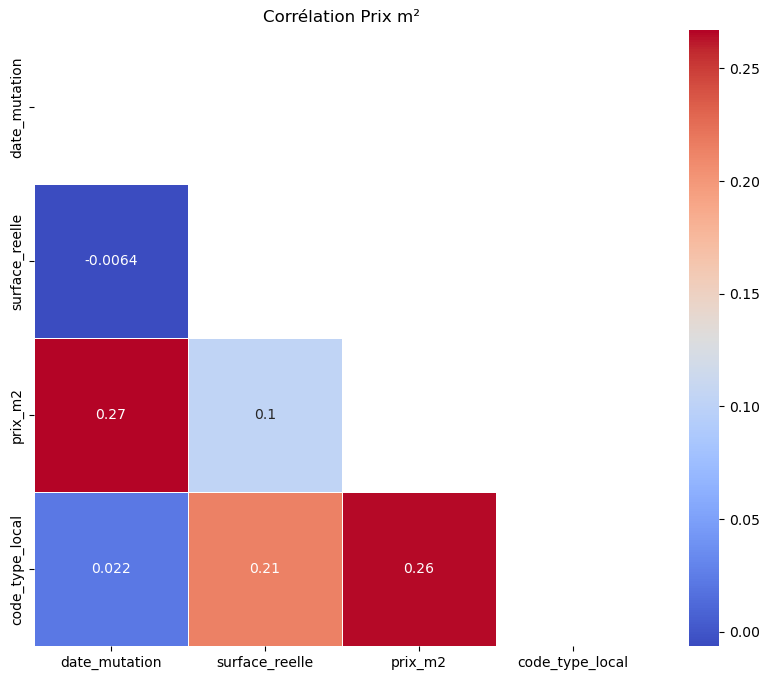

In [81]:
############################
# Analyse des correlations #
############################

#Création d'un heatmap de correlation 

# Calcul de la matrice de corrélation
corr_matrice = df_transaction[['date_mutation', 'surface_reelle', 'prix_m2', 'code_type_local']].corr() 

# Créer un masque pour la heatmap
masque = np.triu(np.ones_like(corr_matrice, dtype=bool)) 

# Créer la figure et la heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrice, annot=True, mask=masque, cmap='coolwarm', square=True, linewidths=0.5)

plt.title('Corrélation Prix m²')

# Afficher la heatmap
plt.show()

#### D. Graphique Dispersion Transaction par Arrondissement

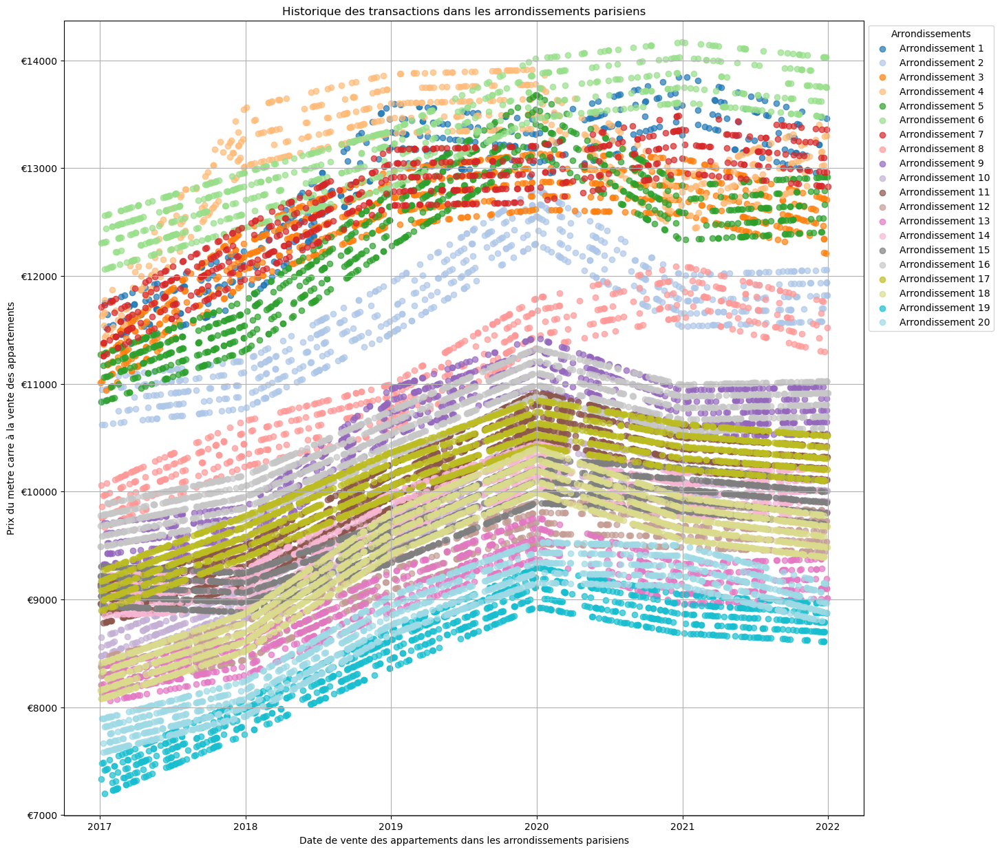

In [83]:
## Disperrsion de l'ensemble des arrondissements

# Création du scatter plot
plt.figure(figsize=(15,15))

# Générer une couleur différente pour chaque code postal
couleurs = plt.cm.tab20(np.linspace(0, 1, 20))  # Palette de 20 couleurs

# Ajout des données pour chaque arrondissement
for i, code_postal in enumerate(range(75001, 75021)):
    
    # Filtrer les données pour l'arrondissement courant
    data = transaction_apt[transaction_apt['code_postal'] == code_postal]
    
    # Tracer les points pour cet arrondissement
    num_arrondissement = code_postal - 75000  # Numéro de l'arrondissement
    plt.scatter(data['date_mutation'], data['prix_m2'], alpha=0.7, 
                label=f'Arrondissement {num_arrondissement}', color=couleurs[i])


# Configuration des axes
plt.xlabel("Date de vente des appartements dans les arrondissements parisiens")
plt.ylabel("Prix du metre carre à la vente des appartements")

# Formatage de l'axe des ordonnées
formatter = ticker.FormatStrFormatter('€%d')
plt.gca().yaxis.set_major_formatter(formatter)

# Définir les limites des prix pour une meilleure lisibilité
plt.ylim(transaction_apt['prix_m2'].min() - 200, transaction_apt['prix_m2'].max() + 200)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both')
plt.title('Historique des transactions dans les arrondissements parisiens')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Arrondissements")

plt.show()

#### E. Graphique Dispersion Moyenne Transaction par Arrondissement

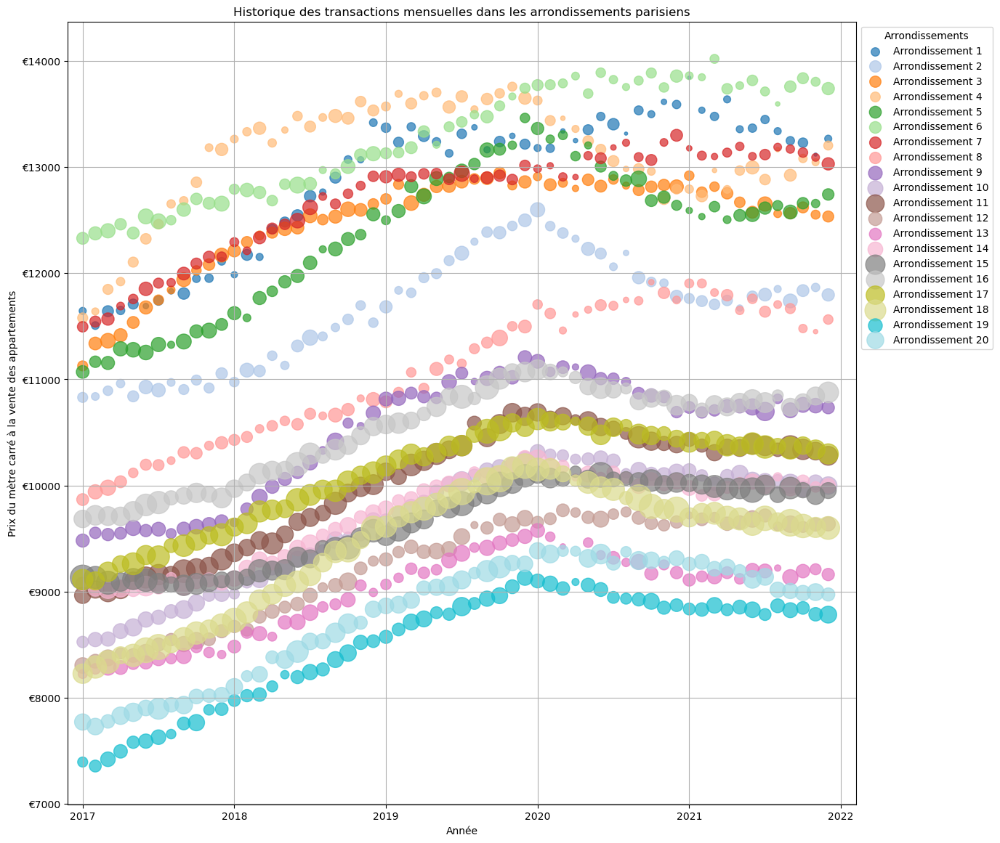

In [85]:
### Amélioration de la visualisation précédente en définissant la moyenne des prix par mois

# Calculer les moyennes mensuelles et le nombre de transactions par code postal
transaction_apt['annee'] = transaction_apt['date_mutation'].dt.year
transaction_apt['mois'] = transaction_apt['date_mutation'].dt.month

# Regrouper les données par code postal, année, et mois
grouped_data = transaction_apt.groupby(
    ['code_postal', 'annee', 'mois']
).agg({
    'prix_m2': 'mean', 
    'date_mutation': 'count'
}).rename(columns={'date_mutation': 'nb_transactions'}).reset_index()

# Création du scatter plot
plt.figure(figsize=(14, 14))

# Générer une couleur différente pour chaque code postal
couleurs = plt.cm.tab20(np.linspace(0, 1, 20))  # Palette de 20 couleurs

# Ajout des données pour chaque arrondissement
for i, code_postal in enumerate(range(75001, 75021)):
    
    # Filtrer les données pour l'arrondissement courant
    data = grouped_data[grouped_data['code_postal'] == code_postal]
    
    # Tracer les points pour cet arrondissement
    num_arrondissement = code_postal - 75000  # Numéro de l'arrondissement
    
    plt.scatter(
        data['annee'] + (data['mois'] - 1) / 12,  # Position mensuelle sur l'axe x
        data['prix_m2'], 
        s=data['nb_transactions']*10,  # Taille des points proportionnelle au nombre de transactions
        alpha=0.7, 
        label=f'Arrondissement {num_arrondissement}', 
        color=couleurs[i]
    )

# Configuration des axes
plt.xlabel("Année")
plt.ylabel("Prix du mètre carré à la vente des appartements")

# Formatage de l'axe des ordonnées
formatter = ticker.FormatStrFormatter('€%d')
plt.gca().yaxis.set_major_formatter(formatter)

# Définir les limites des prix pour une meilleure lisibilité
plt.ylim(transaction_apt['prix_m2'].min() - 200, transaction_apt['prix_m2'].max() + 200)

# Définir les limites de l'axe X
min_year = transaction_apt['annee'].min()-0.1
max_year = transaction_apt['annee'].max()+1.1
plt.xlim(min_year, max_year)


# Ajout de la grille, du titre et de la légende
plt.grid(which='both')
plt.title('Historique des transactions mensuelles dans les arrondissements parisiens')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title="Arrondissements")

plt.show()

## 8. Vérification de la relation entre le prix au m² et la date dans le 6ème arrondissement par le calcul du coefficient de corrélation de Pearson 

Pour cette distribution nous allons calculer le coefficient de corrélation de Pearson. La relation entre le prix au metre carré et la date n'est pas forcément linéaire mais elle s'en rapproche suffisamment pour que cette analyse soit pertinente (voir l'évolution du prix au metre carré globale montrée plus haut, on a presque une droite sauf entre 2020 et 2021). Ce qui nous interesse c'est de prouver que le temps a une influence sur le prix.

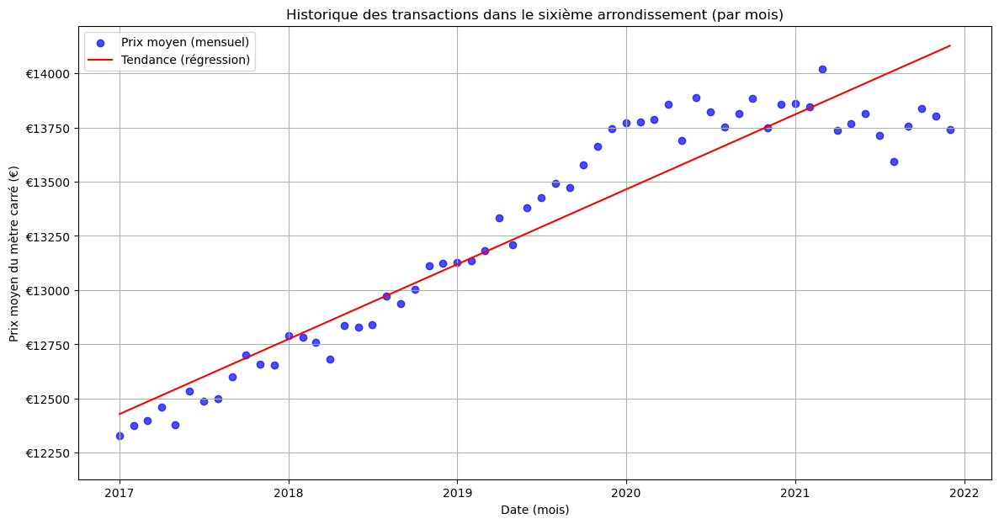

In [88]:

# Filtrer les données pour le 6e arrondissement
cp = 75006
data_75006 = transaction_apt[transaction_apt['code_postal'] == cp].copy()

# Transformation des dates numériques en format de dates lisibles si nécessaire
data_75006['date_mutation'] = pd.to_datetime(data_75006['date_mutation'])

# Regrouper les données par mois et calculer la moyenne du prix au m²
data_75006['year_month'] = data_75006['date_mutation'].dt.to_period('M')  # Extraire l'année et le mois
monthly_data = data_75006.groupby('year_month')['prix_m2'].mean().reset_index()

# Convertir 'year_month' en datetime pour la visualisation
monthly_data['year_month'] = monthly_data['year_month'].dt.to_timestamp()

# Création de la figure
plt.figure(figsize=(14, 7))

# Scatter plot : Date de vente vs Prix moyen au m² (par mois)
plt.scatter(monthly_data['year_month'], monthly_data['prix_m2'], alpha=0.7, label='Prix moyen (mensuel)', color='blue')

# Ajout de la régression linéaire en rouge
x = monthly_data['year_month'].map(lambda d: d.toordinal())  # Conversion des dates en valeurs numériques
y = monthly_data['prix_m2']
m, b = np.polyfit(x, y, 1)  # Ajustement d'une ligne de régression
plt.plot(monthly_data['year_month'], m * x + b, color='red', label='Tendance (régression)')

# Configuration des axes
plt.xlabel('Date (mois)')
plt.ylabel('Prix moyen du mètre carré (€)')

# Formatage de l'axe des ordonnées
formatter = ticker.FormatStrFormatter('€%d')
plt.gca().yaxis.set_major_formatter(formatter)

# Limite des prix pour une meilleure lisibilité
plt.ylim(monthly_data['prix_m2'].min() - 200, monthly_data['prix_m2'].max() + 200)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both')
plt.title('Historique des transactions dans le sixième arrondissement (par mois)')
plt.legend()

# Affichage du graphique
plt.show()

#### A. Corrélation Spearman

In [90]:
#On calcule la corrélation de Spearman
from scipy import stats
from scipy.stats import spearmanr

# Filtrer les données pour le 6ème arrondissement
data_75006 = transaction_apt[transaction_apt['code_postal'] == 75006].copy()

# Convertir les dates en valeurs numériques (timestamp ou année)
data_75006['date_numeric'] = data_75006['date_mutation'].dt.year

# Vérification des colonnes nécessaires
prix_m2 = data_75006['prix_m2']
date_numeric = data_75006['date_numeric']

# Calcul de la corrélation de Spearman
spearman_corr, spearman_p_value = spearmanr(date_numeric, prix_m2)

# Affichage des résultats
print(f"Le coefficient de corrélation de Spearman est : {spearman_corr:.2f}\n")
print(f"La p-valeur associée est : {spearman_p_value:.4f}\n")

if spearman_p_value < 0.05:
    print("La relation entre la date et le prix au mètre carré est statistiquement significative.")
else:
    print("La relation entre la date et le prix au mètre carré n'est pas statistiquement significative.")

Le coefficient de corrélation de Spearman est : 0.90

La p-valeur associée est : 0.0000

La relation entre la date et le prix au mètre carré est statistiquement significative.


#### B. Corrélation de Pearson

In [92]:
#On calcule la corrélation de Pearson
from scipy.stats import pearsonr

# Calcul du coefficient de corrélation de Pearson
pearson_corr, pearson_p_value = pearsonr(date_numeric,prix_m2)

# Affichage des résultats
print(f"Le coefficient de corrélation de Pearson est : {pearson_corr:.2f}\n")
print(f"La p-valeur associée est : {pearson_p_value:.4f}\n")

if pearson_p_value < 0.05:
    print("La relation entre la date et le prix au mètre carré est statistiquement significative.")
else:
    print("La relation entre la date et le prix au mètre carré n'est pas statistiquement significative.")

Le coefficient de corrélation de Pearson est : 0.89

La p-valeur associée est : 0.0000

La relation entre la date et le prix au mètre carré est statistiquement significative.


## 9. Vérification de la relation entre la valeur fonciere et la surface

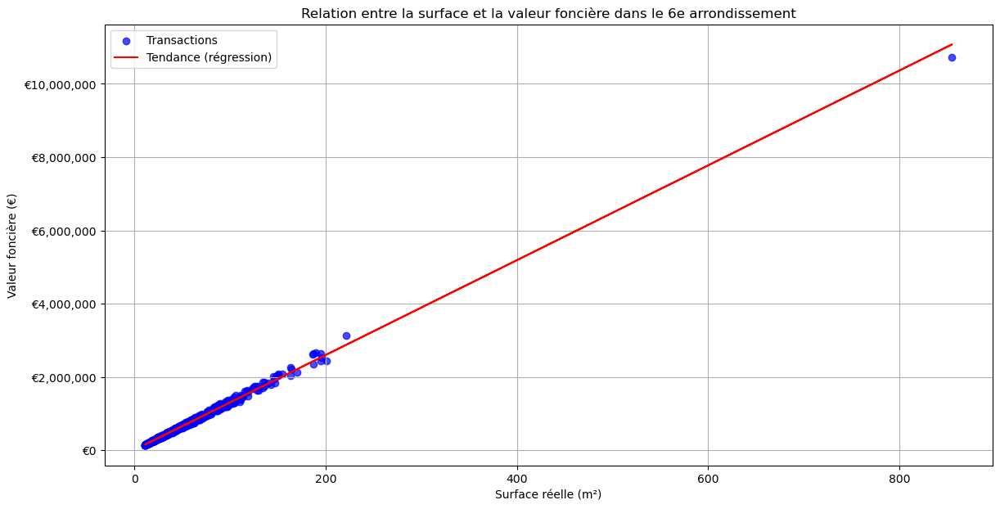

In [94]:
# Création de la figure
plt.figure(figsize=(14, 7))

data_75006['surface_reelle'] = pd.to_numeric(data_75006['surface_reelle'], errors='coerce')
data_75006['valeur_fonciere'] = pd.to_numeric(data_75006['valeur_fonciere'], errors='coerce')

# Scatter plot : Surface réelle vs Valeur foncière
plt.scatter(data_75006['surface_reelle'], data_75006['valeur_fonciere'], alpha=0.7, label='Transactions', color='blue')

# Ajout de la régression linéaire en rouge
x = data_75006['surface_reelle']
y = data_75006['valeur_fonciere']
m, b = np.polyfit(x, y, 1)  # Ajustement d'une ligne de régression
plt.plot(x, m * x + b, color='red', label='Tendance (régression)')

# Configuration des axes
plt.xlabel('Surface réelle (m²)')
plt.ylabel('Valeur foncière (€)')

# Formatage de l'axe des ordonnées
formatter = ticker.StrMethodFormatter('€{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both')
plt.title('Relation entre la surface et la valeur foncière dans le 6e arrondissement')
plt.legend()

# Affichage du graphique
plt.show()

#### A. Corrélation de Spearman

In [96]:
#On calcule la corrélation de SPEARMAN

# Vérification des colonnes nécessaires
valeur_fonciere = data_75006['valeur_fonciere']
surface = data_75006['surface_reelle']

# Calcul de la corrélation de Spearman
spearman_corr, spearman_p_value = spearmanr(surface, valeur_fonciere)

# Affichage des résultats
print(f"Le coefficient de corrélation de Spearman est : {spearman_corr:.2f}\n")
print(f"La p-valeur associée est : {spearman_p_value:.4f}\n")

if spearman_p_value < 0.05:
    print("La relation entre la surface et la valeur foncière est statistiquement significative.")
else:
    print("La relation entre la surface et la valeur foncière n'est pas statistiquement significative.")


Le coefficient de corrélation de Spearman est : 1.00

La p-valeur associée est : 0.0000

La relation entre la surface et la valeur foncière est statistiquement significative.


#### B. Corrélation de Pearson

In [98]:
#On calcule la corrélation de Pearson

# Vérification des colonnes nécessaires
valeur_fonciere = data_75006['valeur_fonciere']
surface = data_75006['surface_reelle']

# Calcul de la corrélation de Pearson
pearson_corr, pearson_p_value = pearsonr(surface, valeur_fonciere)

# Affichage des résultats
print(f"Le coefficient de corrélation de Pearson est : {pearson_corr:.2f}\n")
print(f"La p-valeur associée est : {pearson_p_value:.4f}\n")

if pearson_p_value < 0.05:
    print("La relation entre la surface et la valeur foncière est statistiquement significative.")
else:
    print("La relation entre la surface et la valeur foncière n'est pas statistiquement significative.")


Le coefficient de corrélation de Pearson est : 1.00

La p-valeur associée est : 0.0000

La relation entre la surface et la valeur foncière est statistiquement significative.


Regardons maintenant si le type de bien à une influence sur le prix au metre carré également.

## 10. Analyse des locaux industriels, commerciaux et assimilés 

#### A. Chiffres

In [102]:
#On crée un dataset qui ne contient que les locaux commerciaux
transaction_corporate = df_transaction[df_transaction['code_type_local']==4]
display(transaction_corporate)

,date_mutation,valeur_fonciere,code_postal,code_type_local,type_local,surface_reelle,annee,prix_m2
18,2017-02-01,"3,113,277",75003,4,Local industriel. commercial ou assimilé,250,2017,"12,453"
29,2017-02-17,"1,164,375",75003,4,Local industriel. commercial ou assimilé,95,2017,"12,257"
34,2017-02-20,"380,252",75003,4,Local industriel. commercial ou assimilé,31,2017,"12,266"
91,2017-03-09,"362,384",75001,4,Local industriel. commercial ou assimilé,29,2017,"12,496"
109,2017-03-29,"315,907",75003,4,Local industriel. commercial ou assimilé,25,2017,"12,636"
...,...,...,...,...,...,...,...,...
26149,2021-01-13,"190,344",75002,4,Local industriel. commercial ou assimilé,15,2021,"12,690"
26164,2021-01-26,"448,758",75002,4,Local industriel. commercial ou assimilé,35,2021,"12,822"
26166,2021-01-13,"640,922",75002,4,Local industriel. commercial ou assimilé,49,2021,"13,080"
26190,2021-02-26,"513,194",75004,4,Local industriel. commercial ou assimilé,37,2021,"13,870"


In [103]:
#Préparons un dataframe en regroupant les prix au metre carré moyens des ventes par année

# Groupe prix moyen par année Corporate
mean_prix_transaction_corporate = transaction_corporate.groupby( transaction_corporate['date_mutation'].dt.year).agg({'prix_m2':'mean'}).round(2)
print('Moyenne des prix au metre carré par année pour les Locaux :')
display(mean_prix_transaction_corporate)

Moyenne des prix au metre carré par année pour les Locaux :


,prix_m2
date_mutation,
2017,"10,950"
2018,"11,570"
2019,"11,960"
2020,"11,966"
2021,"12,006"


In [104]:
# Groupe prix moyen par année Appartement
mean_prix_transaction_apt = transaction_apt.groupby( transaction_apt['date_mutation'].dt.year).agg({'prix_m2':'mean'}).round(2)
print('Moyenne des prix au metre carré par année pour les Appartements :')
display(mean_prix_transaction_apt)

Moyenne des prix au metre carré par année pour les Appartements :


,prix_m2
date_mutation,
2017,"9,493"
2018,"10,031"
2019,"10,563"
2020,"10,675"
2021,"10,456"


In [105]:
# Fusionner les deux DataFrames 
result_tableau = pd.concat([mean_prix_transaction_corporate, mean_prix_transaction_apt], axis=1, keys=['Corporate', 'Appartement'])

# Afficher le tableau combiné
print('Moyenne des prix au metre carré par année pour les Locaux et les Appartements :')
display(result_tableau)

Moyenne des prix au metre carré par année pour les Locaux et les Appartements :


,Corporate,Appartement
,prix_m2,prix_m2
date_mutation,,
2017,"10,950","9,493"
2018,"11,570","10,031"
2019,"11,960","10,563"
2020,"11,966","10,675"
2021,"12,006","10,456"


#### B. Graphique Evolution Prix au m²

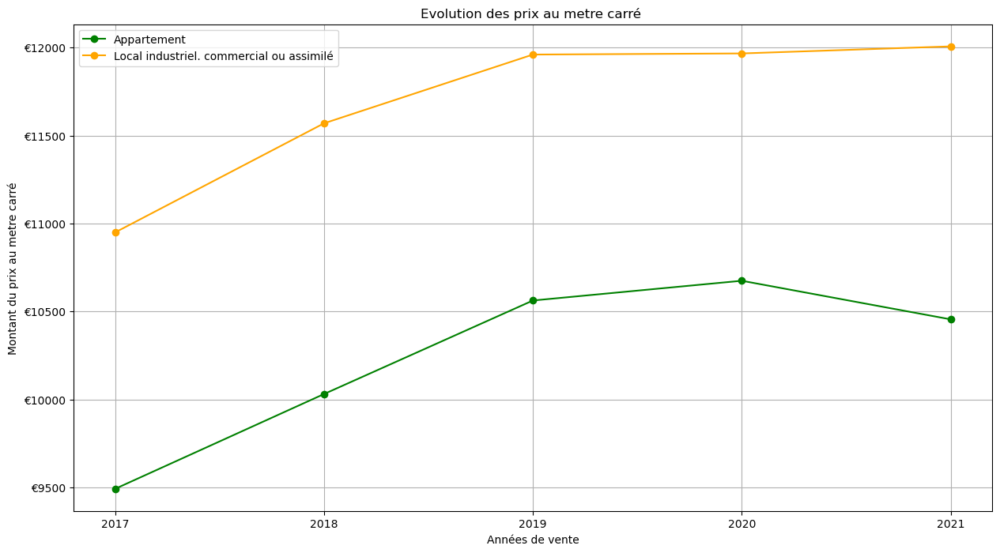

In [107]:
#Création d'un graphique pour visualiser la hausse de la moyenne des prix
plt.figure(figsize=(15,8))

# Générer une palette de couleurs avec suffisamment d'éléments
type_colors = {2:'green', 4:'orange'}

# Groupement par code_postal et année
prix_par_type_local = (
    df_transaction.groupby([df_transaction['code_type_local'],df_transaction['type_local'], df_transaction['date_mutation'].dt.year.astype(str)])
    .agg({'prix_m2': 'mean'})
    .round(2)
    .reset_index()
)

# Parcourir les types de locaux
for i in [2,4]:
    
    data = prix_par_type_local[prix_par_type_local['code_type_local']==i]
    
    # Extraire les années et les prix moyens
    annees = data['date_mutation']
    prix_moyen = data['prix_m2']
    
    # Tracer les données pour ce type de local
    type_local = data['type_local'].iloc[0]  # Nom du type de local 
    
    plt.plot(annees, prix_moyen, marker='o', label=f'{type_local}', color=type_colors[i])
    
# Configuration des axes    
plt.xlabel('Années de vente')
plt.ylabel('Montant du prix au metre carré')

# Formatage de l'axe des ordonnées
formatter = ticker.FormatStrFormatter('€%d')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid()
plt.title('Evolution des prix au metre carré ')
plt.legend()

# Affichage du graphique
plt.show()

#### Conclusion M1

Le prix moyen au metre carrée des locaux commerciaux est superieur à celui des appartements
De plus il ne connait pas de décroissance en 2021

Après ces analyses, nous pouvons conclure que les dimensions à utiliser pour prédire le prix au m² sont : 
- la surface du bien immobilier,
- la date considérée, 
- la localisation (code_postal), 
- le type de bien.

# Milestone 2 - Entraînement de l'algorithme

Dans cette section nous allons maintenant entrâiner un algorithme à prédire la valeur fonciere d'un bien immobilier. Pour cela nous allons utiliser l'algorithme de régression linéaire.

In [113]:
df_transaction.head()

,date_mutation,valeur_fonciere,code_postal,code_type_local,type_local,surface_reelle,annee,prix_m2
0,2017-01-03,"550,560",75003,2,Appartement,50,2017,"11,011"
1,2017-01-12,"1,576,492",75008,2,Appartement,163,2017,"9,672"
2,2017-01-10,"657,757",75008,2,Appartement,66,2017,"9,966"
3,2017-01-10,"250,087",75003,2,Appartement,22,2017,"11,368"
4,2017-01-13,"176,267",75001,2,Appartement,15,2017,"11,751"


In [114]:
# Conversion en timestamp
df_transaction['date_mutation_timestamp'] = df_transaction['date_mutation'].apply(lambda x: pd.Timestamp(x).timestamp())
display(df_transaction)

,date_mutation,valeur_fonciere,code_postal,code_type_local,type_local,surface_reelle,annee,prix_m2,date_mutation_timestamp
0,2017-01-03,"550,560",75003,2,Appartement,50,2017,"11,011","1,483,401,600"
1,2017-01-12,"1,576,492",75008,2,Appartement,163,2017,"9,672","1,484,179,200"
2,2017-01-10,"657,757",75008,2,Appartement,66,2017,"9,966","1,484,006,400"
3,2017-01-10,"250,087",75003,2,Appartement,22,2017,"11,368","1,484,006,400"
4,2017-01-13,"176,267",75001,2,Appartement,15,2017,"11,751","1,484,265,600"
...,...,...,...,...,...,...,...,...,...
26191,2021-02-25,"471,224",75004,2,Appartement,37,2021,"12,736","1,614,211,200"
26192,2021-02-17,"1,982,330",75002,4,Local industriel. commercial ou assimilé,150,2021,"13,216","1,613,520,000"
26193,2021-03-08,"312,436",75002,2,Appartement,26,2021,"12,017","1,615,161,600"
26194,2021-03-11,"156,223",75002,2,Appartement,13,2021,"12,017","1,615,420,800"


## A. Valeur Foncière / Surface

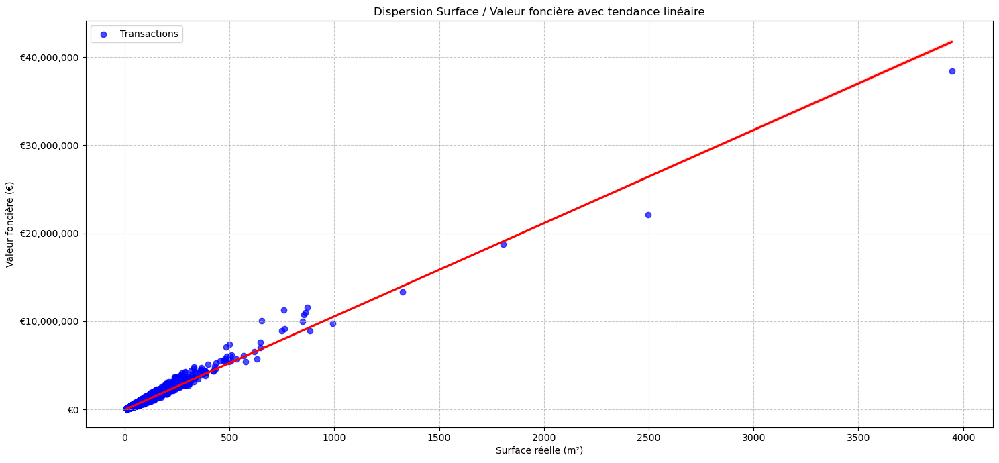

In [116]:

# Création du graphique combiné
plt.figure(figsize=(15, 7))

# Scatter plot : Surface réelle vs Valeur foncière
plt.scatter(
    df_transaction['surface_reelle'], 
    df_transaction['valeur_fonciere'], 
    alpha=0.7, 
    label='Transactions', 
    color='blue'
)

# Droite de régression linéaire avec Seaborn
sns.regplot(
    data=df_transaction, 
    x="surface_reelle", 
    y="valeur_fonciere", 
    robust=True, 
    scatter=False, 
    line_kws=dict(color="red", label='Tendance linéaire')
)

# Configuration des axes
plt.xlabel('Surface réelle (m²)')
plt.ylabel('Valeur foncière (€)')

# Formatage de l'axe des ordonnées
formatter = ticker.StrMethodFormatter('€{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both', linestyle='--', alpha=0.7)
plt.title('Dispersion Surface / Valeur foncière avec tendance linéaire')
plt.legend()

# Affichage du graphique
plt.tight_layout()
plt.show()

In [117]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Sélection des colonnes pertinentes
X = df_historique[['surface_reelle']]
y = df_historique['valeur_fonciere']

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

# Initialisation et entraînement de l'algorithme de régression linéaire
reg = LinearRegression()
reg.fit(X_train, y_train)

score = reg.score(X_train,y_train)

print(f"Score : {score*100:.2f}%")

Score : 96.15%


In [118]:

# Prédiction sur l'ensemble de test
y_pred = reg.predict(X_test)

In [119]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

print(f"RMSE: {mean_squared_error(y_test, y_pred):.2f}")

print(f"MAPE: {mean_absolute_percentage_error(y_test, y_pred)*100:.2f}%")

RMSE: 13898897114.63
MAPE: 10.77%


## B. Valeur Foncière / Code Postal

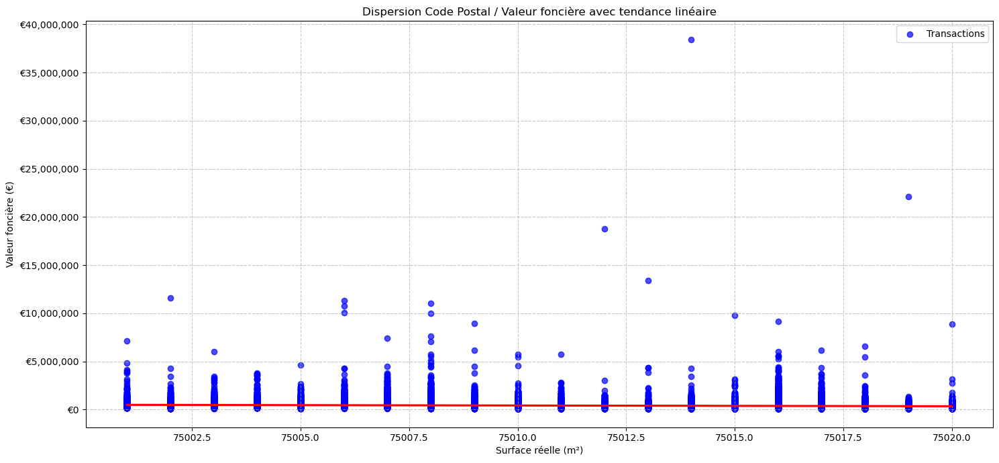

In [121]:

# Création du graphique combiné
plt.figure(figsize=(15, 7))

# Scatter plot : Surface réelle vs Valeur foncière
plt.scatter(
    df_transaction['code_postal'], 
    df_transaction['valeur_fonciere'], 
    alpha=0.7, 
    label='Transactions', 
    color='blue'
)

# Droite de régression linéaire avec Seaborn
sns.regplot(
    data=df_transaction, 
    x="code_postal", 
    y="valeur_fonciere", 
    robust=True, 
    scatter=False, 
    line_kws=dict(color="red", label='Tendance linéaire')
)

# Configuration des axes
plt.xlabel('Surface réelle (m²)')
plt.ylabel('Valeur foncière (€)')

# Formatage de l'axe des ordonnées
formatter = ticker.StrMethodFormatter('€{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both', linestyle='--', alpha=0.7)
plt.title('Dispersion Code Postal / Valeur foncière avec tendance linéaire')
plt.legend()

# Affichage du graphique
plt.tight_layout()
plt.show()

<Axes: xlabel='code_postal', ylabel='valeur_fonciere'>

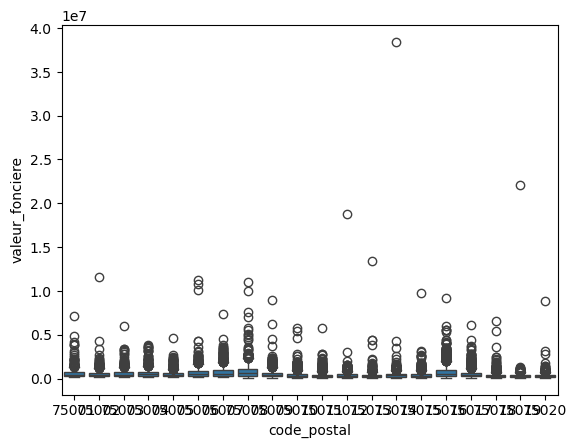

In [122]:
sns.boxplot(data = df_transaction, x="code_postal", y="valeur_fonciere")

In [123]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

# Sélection des colonnes pertinentes
X = df_transaction[['code_postal']]
y = df_transaction['valeur_fonciere']

# Transformation des colonnes catégoriques 
column_transformer = ColumnTransformer(transformers=[ ('cat', OneHotEncoder(), ['code_postal']) ], remainder='passthrough') 

# Transformation des données 
X_transformed = column_transformer.fit_transform(X)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.33, random_state=42)

clf = LinearRegression().fit(X_train, y_train)
score = clf.score(X_test, y_test)
print(f"Score: {score*100:.2f}%")

Score: 4.20%


In [124]:
# Prédiction sur l'ensemble de test
y_pred = clf.predict(X_test)

from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

rmse = mean_squared_error(y_test, y_pred)

print(f"Ecart quadratique moyen : {rmse:.2f}")

Ecart quadratique moyen : 420829226254.99


In [125]:
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Erreur absolue moyenne en pourcentage : {mape* 100:.2f}%")

Erreur absolue moyenne en pourcentage : 74.42%


## C. Valeur Foncière / Code Type Local

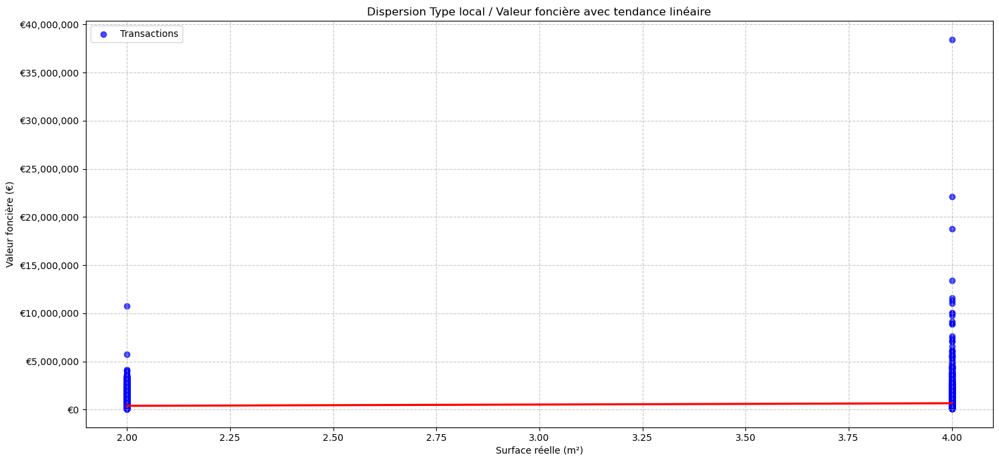

In [127]:

# Création du graphique combiné
plt.figure(figsize=(15, 7))

# Scatter plot : Surface réelle vs Valeur foncière
plt.scatter(
    df_transaction['code_type_local'], 
    df_transaction['valeur_fonciere'], 
    alpha=0.7, 
    label='Transactions', 
    color='blue'
)

# Droite de régression linéaire avec Seaborn
sns.regplot(
    data=df_transaction, 
    x="code_type_local", 
    y="valeur_fonciere", 
    robust=True, 
    scatter=False, 
    line_kws=dict(color="red", label='Tendance linéaire')
)

# Configuration des axes
plt.xlabel('Surface réelle (m²)')
plt.ylabel('Valeur foncière (€)')

# Formatage de l'axe des ordonnées
formatter = ticker.StrMethodFormatter('€{x:,.0f}')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both', linestyle='--', alpha=0.7)
plt.title('Dispersion Type local / Valeur foncière avec tendance linéaire')
plt.legend()

# Affichage du graphique
plt.tight_layout()
plt.show()

<Axes: xlabel='type_local', ylabel='valeur_fonciere'>

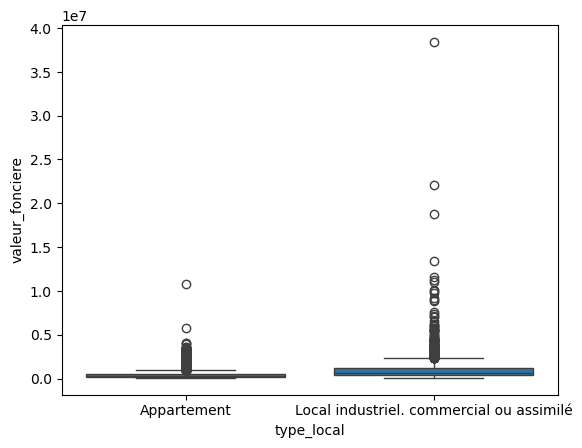

In [128]:
sns.boxplot(data = df_transaction, x="type_local", y="valeur_fonciere")

In [129]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

# Sélection des colonnes pertinentes
X = df_transaction[['type_local']]
y = df_transaction['valeur_fonciere']

# Transformation des colonnes catégoriques 
column_transformer = ColumnTransformer(transformers=[ ('cat', OneHotEncoder(), ['type_local']) ], remainder='passthrough') 

# Transformation des données 
X_transformed = column_transformer.fit_transform(X)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.33, random_state=42)

clf = LinearRegression().fit(X_train, y_train)
score = clf.score(X_test, y_test)
print(f"Score : {score}")

Score : 0.0574510015651285


In [130]:
# Prédiction sur l'ensemble de test
y_pred = clf.predict(X_test)

from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

rmse = mean_squared_error(y_test, y_pred)

print(f"Ecart quadratique moyen : {rmse:.2f}")

Ecart quadratique moyen : 414041899843.72


In [131]:
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Erreur absolue moyenne en pourcentage : {mape* 100:.2f}%")

Erreur absolue moyenne en pourcentage : 77.35%


In [132]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

# Sélection des colonnes pertinentes
X = df_transaction[['code_type_local', 'surface_reelle']]
y = df_transaction['valeur_fonciere']

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

reg0 = LinearRegression().fit(X_train, y_train)
score = reg0.score(X_train, y_train)
print(f"Score : {score*100:.2f}%")

Score : 96.36%


In [133]:
# Prédiction sur l'ensemble de test
y_pred = reg0.predict(X_train)

from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

rmse = mean_squared_error(y_train, y_pred)

print(f"Ecart quadratique moyen : {rmse:.2f}")

Ecart quadratique moyen : 9863838135.58


In [134]:
mape = mean_absolute_percentage_error(y_train, y_pred)

print(f"Erreur absolue moyenne en pourcentage : {mape* 100:.2f}%")

Erreur absolue moyenne en pourcentage : 10.65%


## D. Entrainement des données 

On utilise le train_test_split pour prélever un tiers de nos données (33%) et les garder de côté. Nous allons entraîner notre algorithme sur le reste des données et puis mesurer notre erreur moyenne en pourcentage de la valeur foncière

In [137]:
# On sépare le jeu de données entre echantillons d'apprentissage et de test 
# La valeur y à trouver est la valeur foncière

### 1. Test Size 33%

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

# Sélection des colonnes pertinentes
X = df_transaction[['code_postal', 'code_type_local', 'surface_reelle']]
y = df_transaction['valeur_fonciere']

# Transformation des colonnes catégoriques 
column_transformer = ColumnTransformer(transformers=[ ('cat', OneHotEncoder(), ['code_postal']) ], remainder='passthrough') 

# Transformation des données 
X_transformed = column_transformer.fit_transform(X)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.33, random_state=42)

# Initialisation et entraînement de l'algorithme de régression linéaire
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [140]:
# le score
r2_test = reg.score(X_test,y_test)

print(f"Coefficient de détermination R^2 : {r2_test*100:.2f}%")

Coefficient de détermination R^2 : 98.50%


In [141]:
# Prédiction sur l'ensemble de test
y_pred = reg.predict(X_test)

print("Modèle entraîné et prédictions réalisées avec succès!")

Modèle entraîné et prédictions réalisées avec succès!


In [142]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error

rmse = mean_squared_error(y_test, y_pred)

print(f"Ecart quadratique moyen : {rmse:.2f}")

Ecart quadratique moyen : 6582043484.03


In [143]:
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Erreur absolue moyenne en pourcentage : {mape* 100:.2f}%")

Erreur absolue moyenne en pourcentage : 9.83%


### 2. Test Size 20% + Stratify

In [145]:

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.20, random_state=42, stratify=df_transaction['code_type_local'])

# Initialisation et entraînement de l'algorithme de régression linéaire
reg = LinearRegression()

reg.fit(X_train, y_train)

print(f"Score : {reg.score(X_train,y_train)*100:.2f}%\n")

y_hat_test = reg.predict(X_test)


print(f"Coefficients: {reg.coef_}\n")

print(f"RMSE: {mean_squared_error(y_test, y_hat_test):.2f}\n")

print(f"MAPE: {mean_absolute_percentage_error(y_test, y_hat_test)*100:.2f}%")

Score : 98.20%

Coefficients: [101120.92368757  39868.90929779  69779.55299254 113966.8367881
  53953.35100331 131763.31826326 110064.73956654  26940.70757302
 -17805.59929324 -54510.13386235 -36473.95013692 -70842.52007862
 -74781.37536326 -53415.76337251 -54086.53617643 -18461.23452322
 -36626.1459969  -55593.00293853 -92500.67726296 -82361.40016717
  44484.79699662  10644.33738469]

RMSE: 8393392200.04

MAPE: 9.74%


### 3. Test Size 50% + Stratify

In [147]:

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.50, random_state=42)

# Initialisation et entraînement de l'algorithme de régression linéaire
reg = LinearRegression()

reg.fit(X_train, y_train)

print(f"Score : {reg.score(X_train,y_train)*100:.2f}%\n")

y_hat_test = reg.predict(X_test)


print(f"Coefficients: {reg.coef_}\n")

print(f"RMSE: {mean_squared_error(y_test, y_hat_test):.2f}\n")

print(f"MAPE: {mean_absolute_percentage_error(y_test, y_hat_test)*100:.2f}%")

Score : 97.71%

Coefficients: [ 93620.84851174  33136.86080067  75233.02726838 114329.2856895
  57862.66999365 129018.63193836 109028.85265671  34621.29337063
 -18100.03999516 -56786.5535034  -36459.43910417 -70267.96054628
 -76077.4853454  -49769.91272208 -52522.28560529 -12591.22780907
 -37280.3779336  -54627.39093433 -99772.84021287 -82595.956518
  44543.01336293  10537.01499936]

RMSE: 6480723056.89

MAPE: 9.59%


### 4. Test Size 80% + Stratify

In [149]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

# Sélection des colonnes pertinentes
X = df_transaction[['code_postal', 'code_type_local', 'surface_reelle']]
y = df_transaction['valeur_fonciere']

# Transformation des colonnes catégoriques 
column_transformer = ColumnTransformer(transformers=[ ('cat', OneHotEncoder(), ['code_postal']) ], remainder='passthrough') 

# Transformation des données 
X_transformed = column_transformer.fit_transform(X)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.80, random_state=42, stratify=df_transaction['code_type_local'])

# Initialisation et entraînement de l'algorithme de régression linéaire
reg = LinearRegression()

reg.fit(X_train, y_train)

print(f"Score : {reg.score(X_train,y_train)*100:.2f}%\n")

y_hat_test = reg.predict(X_test)

print(f"RMSE: {mean_squared_error(y_test, y_hat_test):.2f}\n")

print(f"MAPE: {mean_absolute_percentage_error(y_test, y_hat_test)*100:.2f}%")

Score : 98.84%

RMSE: 7060956437.68

MAPE: 9.34%


### 5. Test Size 33% + Stratify

In [151]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer

# Sélection des colonnes pertinentes
X = df_transaction[['code_postal', 'code_type_local', 'surface_reelle','date_mutation_timestamp']]
y = df_transaction['valeur_fonciere']

# Transformation des colonnes catégoriques 
column_transformer = ColumnTransformer(transformers=[ ('cat', OneHotEncoder(), ['code_postal']) ], remainder='passthrough') 

# Transformation des données 
X_transformed = column_transformer.fit_transform(X)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.33, random_state=42, stratify=df_transaction['code_type_local'])

# Initialisation et entraînement de l'algorithme de régression linéaire
reg = LinearRegression()

reg.fit(X_train, y_train)

print(f"Score R² : {reg.score(X_train,y_train)*100:.2f}%\n")

y_hat_test = reg.predict(X_test)

print(f"RMSE: {mean_squared_error(y_test, y_hat_test):.2f}\n")

print(f"MAPE: {mean_absolute_percentage_error(y_test, y_hat_test)*100:.2f}%")

Score R² : 97.07%

RMSE: 11100492478.10

MAPE: 10.87%


## Conclusion M2

Notre algorithme fait donc 10.87% d'erreur en moyenne sur la prédiction de la valeur foncière.

Mes conclusions sur ce résultat et comment j'aurais pu aller plus loin :
- Avec une coefficient de détermination à 97.07%, le modèle explique très largement la variabilité de la variable cible (y)
- La valeur du Root Mean Squarred Error est extrêmement élevée, ce qui pourrait indiquer que la variable cible est exprimée dans une unité très large ou que les erreurs sont significatives en valeur absolue
- Le Mean Absolute Percentage Error est à 10,87% ce qui signifie qu'en moyenne les prédictions s'éloignent de 10.87% des valeurs réelles

Pour aller plus loin :
- Le retrait des outliers pourrait ammener à un modèle plus robuste
- Vérifier la normalité des résidus via un histogramme ou un test statistique (Shapiro-Wilk)
- Effectuer un rééchantillonnage ou appliquez des poids

# Milestone 3 - Prédiction définitive pour le client 

## 1. Préparations des données

In [156]:
# Visualisation des données des Actifs
df_actif.head()

,adresse_numero,adresse_nom_voie,code_postal,code_commune,nom_commune,surface_carrez,code_type_local,type_local,surface_reelle_bati,nombre_pieces_principales,longitude,latitude
0,127,RUE SAINT-DENIS,75001,75101,Paris 1er Arrondissement,16,2,Appartement,25,1,2,49
1,62,RUE NOTRE-DAME DE NAZARETH,75003,75103,Paris 3e Arrondissement,20,2,Appartement,22,1,2,49
2,62,RUE DE TURENNE,75003,75103,Paris 3e Arrondissement,64,2,Appartement,65,3,2,49
3,32,AV GEORGE V,75008,75108,Paris 8e Arrondissement,63,2,Appartement,74,2,2,49
4,152,BD HAUSSMANN,75008,75108,Paris 8e Arrondissement,21,2,Appartement,22,1,2,49


Nous avons la liste des biens immobiliers de l'entreprise. Pour effectuer une prédiction, nous devons mettre ce fichier au même format que le dataframe que nous avons utilisé lors de l'entraînement de l'algorithme.

In [158]:
#On réutilise les mêmes fonctions pour faire le one hot encoding des variables catégorielles
colonnes_a_conserver = ['code_postal','code_type_local','surface_reelle_bati']

df_predict = df_actif[colonnes_a_conserver]
df_predict = df_predict.rename(columns={'surface_reelle_bati':'surface_reelle'})

df_predict.describe()

,code_postal,code_type_local,surface_reelle
count,275,275,275
mean,"75,012",3,51
std,6,1,40
min,"75,001",2,11
25%,"75,009",2,26
50%,"75,013",2,39
75%,"75,018",4,58
max,"75,020",4,286


In [159]:

#On importe la librairie datetime pour pouvoir créer une colonne timestamp avec la date du 31 décembre 2022 pour la prédiction
import datetime as dt

predict_date = dt.datetime(2022, 12, 31)
df_predict['timestamp'] = pd.Timestamp(predict_date).timestamp()

display(df_predict)

,code_postal,code_type_local,surface_reelle,timestamp
0,75001,2,25,"1,672,444,800"
1,75003,2,22,"1,672,444,800"
2,75003,2,65,"1,672,444,800"
3,75008,2,74,"1,672,444,800"
4,75008,2,22,"1,672,444,800"
...,...,...,...,...
270,75019,4,16,"1,672,444,800"
271,75002,4,15,"1,672,444,800"
272,75002,4,35,"1,672,444,800"
273,75002,4,49,"1,672,444,800"


## 2. Prédiction des données

In [161]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Chargement des données
X = df_transaction[['code_postal', 'code_type_local', 'surface_reelle','date_mutation_timestamp']]
y = df_transaction['valeur_fonciere']

# Prétraitement des données
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), ['code_postal']),  # Encodage des colonnes catégoriques
        ('num', StandardScaler(), ['surface_reelle'])  # Standardisation des colonnes numériques
    ]
)

# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42, stratify=df_transaction['code_type_local'])

# Transformation des données
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Modélisation avec Random Forest
model = RandomForestRegressor(random_state=42, n_estimators=df_predict.shape[0])
model.fit(X_train, y_train)

print(f"Score : {model.score(X_train,y_train)*100:.2f}%\n")

# Prédictions
y_pred = model.predict(X_test)

# Évaluation
print(f"RMSE: {mean_squared_error(y_test, y_pred):.2f}\n")

print(f"MAPE: {mean_absolute_percentage_error(y_test, y_pred)*100:.2f}% \n")


# Prédictions pour l'année suivante
X_next_year = df_predict[['code_postal', 'code_type_local', 'surface_reelle','timestamp']] # Données des actifs pour l'année suivante
X_next_year_transformed = preprocessor.transform(X_next_year)
y_next_year_pred = model.predict(X_next_year_transformed)

Score : 98.36%

RMSE: 4522278389.76

MAPE: 5.12% 



In [162]:

# Résultat des prédictions
print("Prédictions pour l'année suivante :" )
display(y_next_year_pred)

Prédictions pour l'année suivante :


array([ 319725.45782409,  272764.31197577,  845655.49813239,
        808257.07367396,  245396.07825614,  400614.78913569,
        303105.80195822,  567447.95790803,  111505.38693557,
        123051.19187675,  283482.34765366,  180096.97389842,
        439182.06962353,  330970.06229168,  262861.27058575,
        962704.79393068, 1169730.48700282,  392209.45413162,
        896036.25157578,  334644.59357585,  413046.63029705,
        522915.23189166,  111505.38693557,  450473.92619957,
        141543.45270348,  437634.61112925,  751147.77176041,
        741869.51863755,  659890.14287313,  153664.43317932,
        154335.9782922 ,  392209.45413162,  552507.99916063,
        244659.23619985, 1162906.26620996,  216324.92045548,
        472398.07432708,  188761.87219698,  216324.92045548,
        151514.232586  ,  319351.47007184,  301940.81566144,
        331246.71793664,  122969.22075267,  330970.06229168,
        305281.34460296,  206762.19158948,  478696.99302829,
        229777.47177517,

## 3. Graphique Résidu

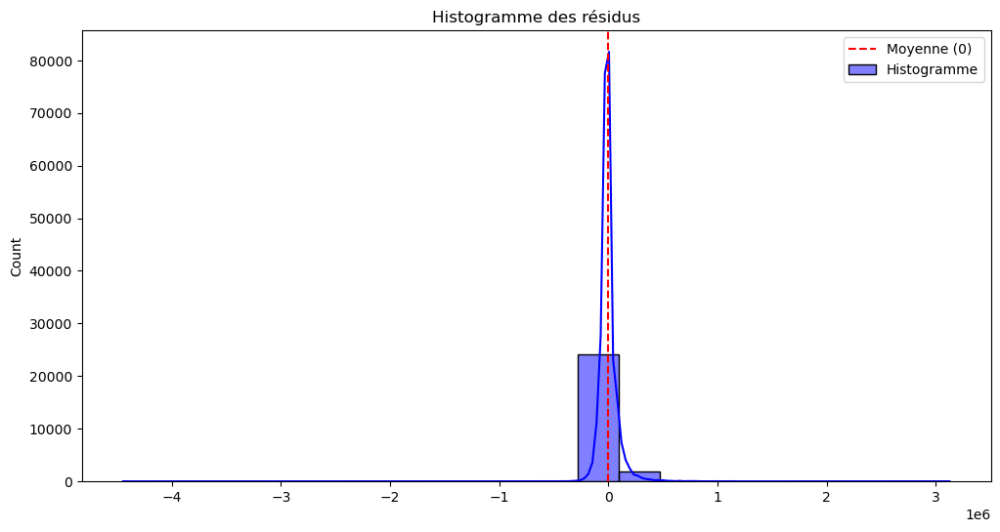

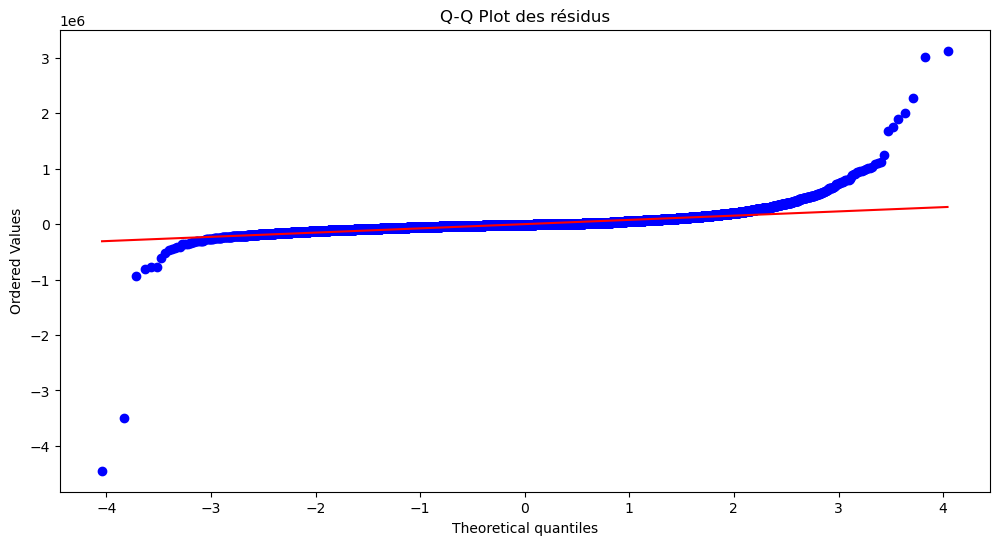

Test de Shapiro-Wilk:
  Statistique: 0.6117, p-valeur: 9.8190e-117

Test de D'Agostino:
  Statistique: 12823.8078, p-valeur: 0.0000e+00



C:\Users\Shiin\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 26196.



In [164]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import shapiro, normaltest, probplot

# Chargement des données
X = df_transaction[['code_postal', 'code_type_local', 'surface_reelle','date_mutation_timestamp']]
y = df_transaction['valeur_fonciere']

# Régression linéaire
model = sm.OLS(y, X).fit()
residuals = model.resid  # Résidus

# Histogramme des résidus
plt.figure(figsize=(12, 6))
sns.histplot(residuals, kde=True, color='blue', bins=20, label='Histogramme')
plt.title('Histogramme des résidus')
plt.axvline(0, color='red', linestyle='--', label='Moyenne (0)')
plt.legend()
plt.show()

# Q-Q Plot
plt.figure(figsize=(12, 6))
probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot des résidus')
plt.show()

# Tests de normalité (Shapiro-Wilk et D’Agostino)
shapiro_test = shapiro(residuals)
dagostino_test = normaltest(residuals)

print("Test de Shapiro-Wilk:")
print(f"  Statistique: {shapiro_test.statistic:.4f}, p-valeur: {shapiro_test.pvalue:.4e}\n")
print("Test de D'Agostino:")
print(f"  Statistique: {dagostino_test.statistic:.4f}, p-valeur: {dagostino_test.pvalue:.4e}\n")

- Histogramme des résidus
  Le graphique montre une forte concentration des résidus autour de zéro, mais avec des queues asymétriques et des valeurs extrêmes.
  Cela suggère que les résidus ne suivent pas une distribution normale parfaite.
  
- Q-Q Plot
  Les points devraient idéalement s'aligner sur la diagonale rouge si les résidus suivaient une distribution normale.
  Les déviations importantes observées aux extrémités (queues) indiquent que les résidus présentent des distributions non normales et des outliers.
  
- Test Shapiro-Wilk et D'Agostino
  Le Test de Shapiro-Wilk et le Test de D'Agostino sont des outils quantitatifs pour vérifier la normalité.
  Avec des p-valeurs extrêmement faibles, les deux tests rejettent clairement l'hypothèse nulle de normalité.
  Cela confirme que les résidus ne sont pas normalement distribués.

In [166]:
df_actif['valeur_fonciere_predite'] = y_next_year_pred

display(df_actif)

,adresse_numero,adresse_nom_voie,code_postal,code_commune,nom_commune,surface_carrez,code_type_local,type_local,surface_reelle_bati,nombre_pieces_principales,longitude,latitude,valeur_fonciere_predite
0,127,RUE SAINT-DENIS,75001,75101,Paris 1er Arrondissement,16,2,Appartement,25,1,2,49,"319,725"
1,62,RUE NOTRE-DAME DE NAZARETH,75003,75103,Paris 3e Arrondissement,20,2,Appartement,22,1,2,49,"272,764"
2,62,RUE DE TURENNE,75003,75103,Paris 3e Arrondissement,64,2,Appartement,65,3,2,49,"845,655"
3,32,AV GEORGE V,75008,75108,Paris 8e Arrondissement,63,2,Appartement,74,2,2,49,"808,257"
4,152,BD HAUSSMANN,75008,75108,Paris 8e Arrondissement,21,2,Appartement,22,1,2,49,"245,396"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
270,15,AV DE LAUMIERE,75019,75119,Paris 19e Arrondissement,14,4,Local industriel. commercial ou assimilé,16,0,2,49,"138,854"
271,3,RUE SAINT-JOSEPH,75002,75102,Paris 2e Arrondissement,14,4,Local industriel. commercial ou assimilé,15,0,2,49,"174,134"
272,2,RUE GRETRY,75002,75102,Paris 2e Arrondissement,35,4,Local industriel. commercial ou assimilé,35,0,2,49,"407,529"
273,115,RUE D ABOUKIR,75002,75102,Paris 2e Arrondissement,42,4,Local industriel. commercial ou assimilé,49,0,2,49,"597,885"


## 4. Calcul des valeurs foncières prédites

In [168]:
total_predict =df_actif.groupby(['code_type_local','type_local']).agg({'valeur_fonciere_predite':'sum'})
display(total_predict)

,,valeur_fonciere_predite
code_type_local,type_local,
2,Appartement,"63,845,391"
4,Local industriel. commercial ou assimilé,"83,708,712"


In [169]:
mean_predict =df_actif.groupby(['code_type_local','type_local']).agg({'valeur_fonciere_predite':'mean'})
display(mean_predict)

,,valeur_fonciere_predite
code_type_local,type_local,
2,Appartement,"414,580"
4,Local industriel. commercial ou assimilé,"691,808"


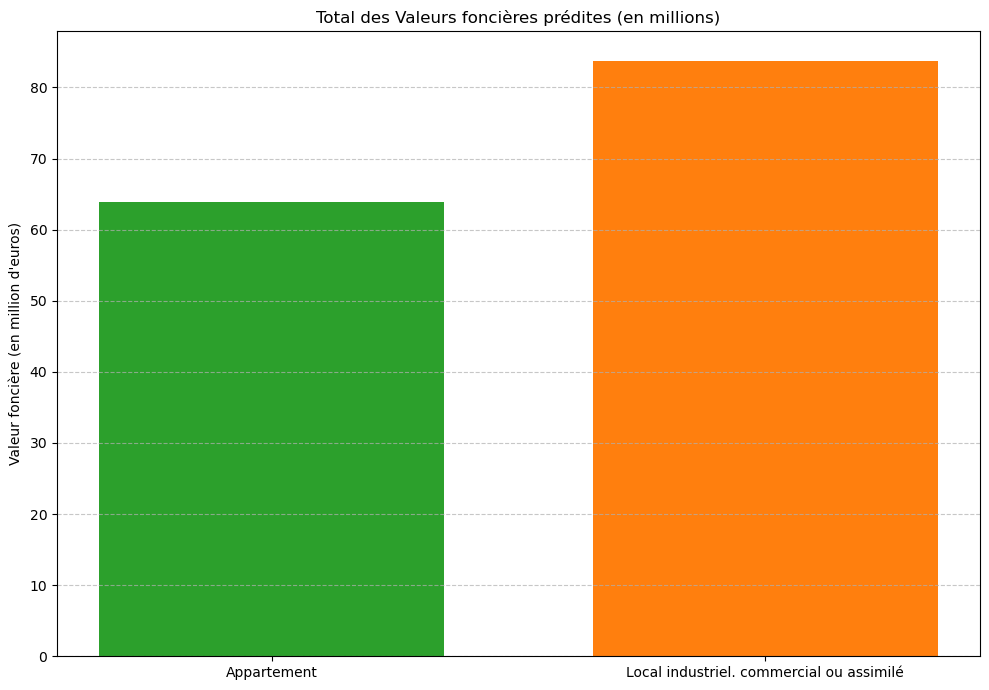

In [170]:
## Graphique répartition des types de biens pour les Actifs
import matplotlib.pyplot as plt

# Label type de biens
x = df_actif['type_local'].unique()

# Valeur type de biens
y = total_predict['valeur_fonciere_predite'] / 1_000_000

# Couleurs
bar_colors = ['tab:green', 'tab:orange']

# Création de l'histogramme
plt.figure(figsize=(10, 7))
plt.bar(x, y, width=0.7, align='center', color=bar_colors)

plt.ylabel("Valeur foncière (en million d'euros)")

# Ajout des légendes et titres
plt.title('Total des Valeurs foncières prédites (en millions)')
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Ajout d'une grille horizontale pour faciliter la lecture

# Affichage du graphique
plt.tight_layout()
plt.show()

In [171]:
#Valorisation du portefeuille sur le segment des particuliers

# Réinitialiser l'index pour transformer les index en colonnes
total_predict = total_predict.reset_index()

# Filtrer les appartements
total_prediction_apt = total_predict[total_predict['type_local'] == 'Appartement']['valeur_fonciere_predite'] / 1_000_000

# Affichage
print(f'la valorisation du segment particulier est (en millions deuros):{total_prediction_apt.iloc[0]:.0f}')

la valorisation du segment particulier est (en millions deuros):64


In [172]:
#Valorisation du portefeuille sur le segment des corporate

# Filtrer les appartements
total_prediction_crp = total_predict[total_predict['type_local'] == 'Local industriel. commercial ou assimilé']['valeur_fonciere_predite'] / 1_000_000

# Affichage
print(f'la valorisation du segment corporate est (en millions deuros):{total_prediction_crp.iloc[0]:.0f}')

la valorisation du segment corporate est (en millions deuros):84


## Conclusion M3

Mes conclusions sur le segment avec la plus grande valorisation et sur les limites de cette estimation :
- Les locaux ont une plus grande valorisation
- Le Score du modèle est très élevé R² = 98,36% mais cela pourrait indiquer un surajustement, ce qui pourrait biaiser les prédictions pour ce segment particulier.
- Un MAPE de 5.12% est globalement faible, mais il peut masquer les erreurs spécifiques à des segments précis comme les locaux industriels
- Les locaux industriels sont sous représentés dans les données transactions et devraient nécessité un rééchantillonnage.

# Milestone 4 - Classification des données issues du jeu de test

## 1. Mise en forme des données

In [177]:
#On visualise les données du dataframe
df_echantillon.head()

,valeur_fonciere,code_postal,nom_commune,surface_reelle
0,"868,687",75019,Paris 19e Arrondissement,88
1,"452,051",75019,Paris 19e Arrondissement,45
2,"193,089",75019,Paris 19e Arrondissement,21
3,"303,013",75019,Paris 19e Arrondissement,32
4,"149,272",75019,Paris 19e Arrondissement,20


In [178]:
# On ne garde que les données utiles
df_echantillon = df_echantillon[['valeur_fonciere','surface_reelle']]


In [179]:
# On défini le prix au metre carré
df_echantillon['prix_m2'] = df_echantillon['valeur_fonciere'] / df_echantillon['surface_reelle']


In [180]:
# On défini le prix au metre carré
df_echantillon = df_echantillon[['prix_m2','surface_reelle']]

df_echantillon.head()

,prix_m2,surface_reelle
0,"9,871",88
1,"10,046",45
2,"9,195",21
3,"9,469",32
4,"7,464",20


Nous observons dans les données que nous avons des valeurs différentes de prix au mètre carré pour un même arrondissement (ici le 19ème arrondissement). Il se peut fort que cela soit notre dimension à utiliser pour attribuer les prix au mètre carré les plus élévé dans un département aux locaux commerciaux, et les prix les plus bas aux appartements.

Pour effectuer cette opération, nous allons utiliser l'algorithme du Kmeans qui va rechercher 2 centroïdes à travers les données.

## 2. Graphique Dispersion prix m² / surface

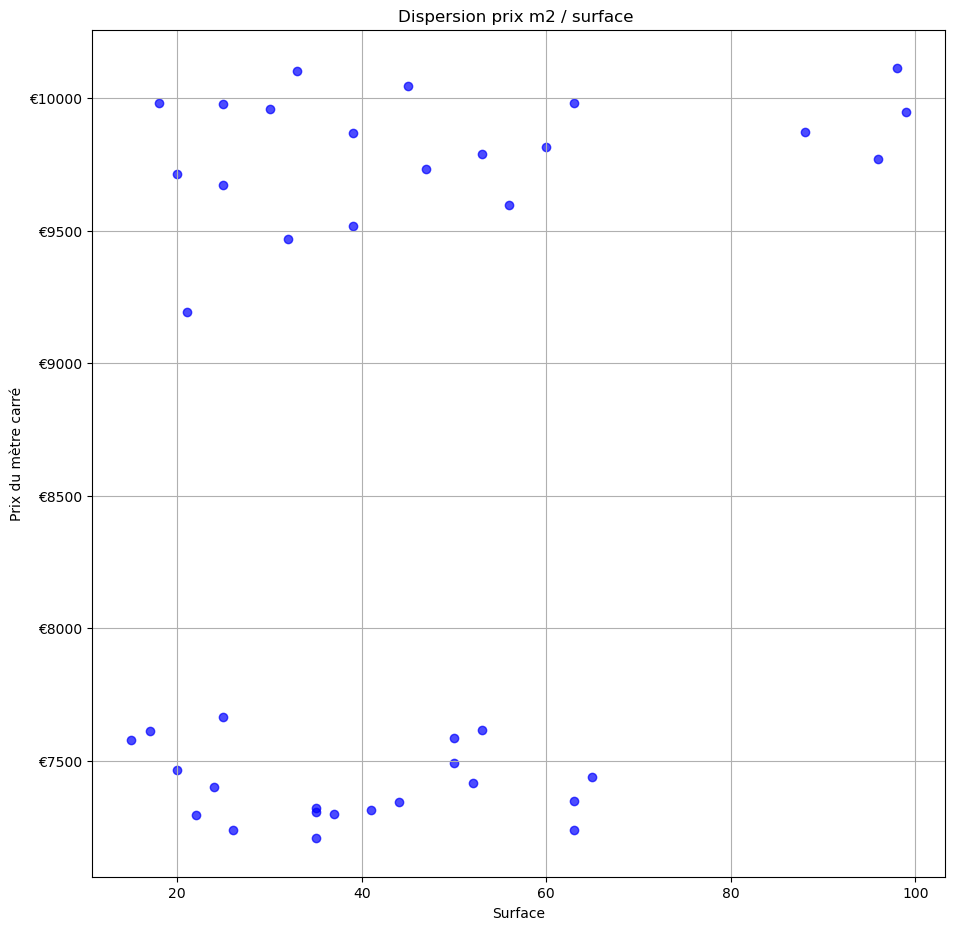

In [183]:
# Création du scatter plot
plt.figure(figsize=(11,11))

# Scatter plot : Date de vente vs Prix au m²
plt.scatter(df_echantillon['surface_reelle'], df_echantillon['prix_m2'], alpha=0.7, label='Transactions', color='blue')

# Configuration des axes
plt.xlabel('Surface')
plt.ylabel('Prix du mètre carré')

# Formatage de l'axe des ordonnées
formatter = ticker.FormatStrFormatter('€%d')
plt.gca().yaxis.set_major_formatter(formatter)

# Ajout de la grille, du titre et de la légende
plt.grid(which='both')
plt.title('Dispersion prix m2 / surface ')

plt.show()

## 3. K-Means

In [185]:
from sklearn.cluster import KMeans

# Données utilisées pour le clustering
X = df_echantillon[['prix_m2','surface_reelle']]

# Initialisation et ajustement du KMeans
k_means = KMeans( n_clusters=2, random_state = 42)
k_means.fit(X)

C:\Users\Shiin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=2, random_state=42)

In [186]:
# Ajout des labels dans le DataFrame pour la visualisation
df_echantillon['cluster'] = k_means.labels_
df_echantillon.head()

,prix_m2,surface_reelle,cluster
0,"9,871",88,1
1,"10,046",45,1
2,"9,195",21,1
3,"9,469",32,1
4,"7,464",20,0


## 4. Graphique Cluster K-Means

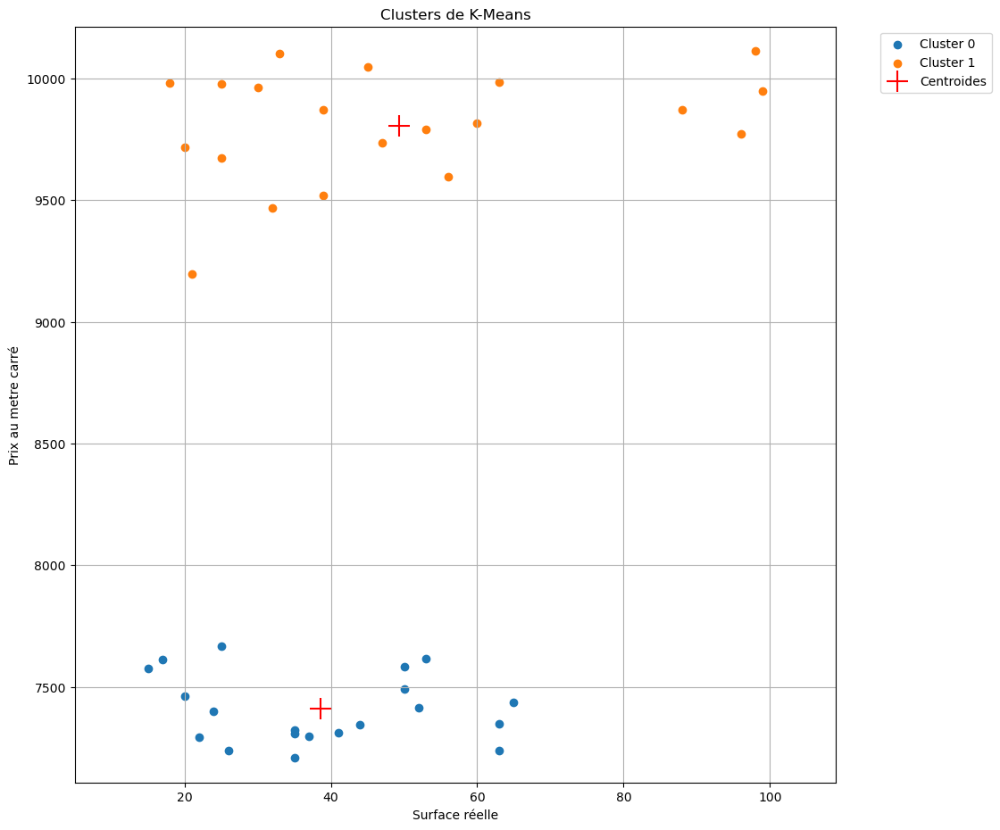

In [188]:
# Visualisation des clusters
plt.figure(figsize=(11, 11))

for cluster in range(k_means.n_clusters):
    cluster_points = df_echantillon[df_echantillon['cluster'] == cluster]
    plt.scatter(cluster_points['surface_reelle'], cluster_points['prix_m2'], label=f'Cluster {cluster}')

# Affichage des centres des clusters
centroids = k_means.cluster_centers_
surface_centroids = centroids[:, 1]  # surface réelle
prix_m2_centroids = centroids[:, 0]  # prix_m2 

plt.scatter(surface_centroids, prix_m2_centroids, s=300, c='red', marker='+', label='Centroides')

plt.xlabel("Surface réelle")
plt.ylabel("Prix au metre carré")

plt.xlim(df_echantillon['surface_reelle'].min()-10,df_echantillon['surface_reelle'].max()+10)
plt.ylim(df_echantillon['prix_m2'].min()-100,df_echantillon['prix_m2'].max()+100)

plt.grid(which='both')
plt.title("Clusters de K-Means")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.show()

## 5. Score et Différentes Métriques

In [190]:
# On vérifie les données de la prédiction
k_means.score(X)

print(f"Score : {k_means.score(X):.2f}")

Score : -1429289.14


On constate que la distance entre les points et leur centroïde est très faible.

In [192]:
from sklearn.metrics import silhouette_score

# Calcul du Silhouette Score
k_means_labels = k_means.predict(X)  # Prédiction des clusters
silhouette = silhouette_score(X, k_means_labels)
print(f"Silhouette Score : {silhouette:.2f}")


Silhouette Score : 0.91


On constate que le coefficient de silhouette est très proche de 1, donc presque parfait

In [194]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

k_accuracy = round(accuracy_score(df_echantillon['cluster'],k_means_labels),2)*100
k_confusion = confusion_matrix(df_echantillon['cluster'],k_means_labels)
                 
print(f"Précision : {k_accuracy}%",)
print()
print(f"Matrice de confusion :\n {k_confusion} ")

Précision : 100.0%

Matrice de confusion :
 [[20  0]
 [ 0 20]] 


Nous avons obtenu notre prédiction. Nous pouvons changer les labels et remplacer les valeurs à 0 par Local industriel. commercial ou assimilé et les valeurs à +1 par Appartement. 

## 6. Mise à jour Cluster et type de bien

In [197]:
#On renomme la colonne cluster en type_local
df_echantillon = df_echantillon.rename( columns={'cluster':'type_local'})

# On change les valeurs au type de local correspondant
df_echantillon['type_local'] = df_echantillon['type_local'].replace({1: 'Local industriel. commercial ou assimilé', 0: 'Appartement'})
    
df_echantillon.head(10)

,prix_m2,surface_reelle,type_local
0,"9,871",88,Local industriel. commercial ou assimilé
1,"10,046",45,Local industriel. commercial ou assimilé
2,"9,195",21,Local industriel. commercial ou assimilé
3,"9,469",32,Local industriel. commercial ou assimilé
4,"7,464",20,Appartement
5,"9,982",18,Local industriel. commercial ou assimilé
6,"9,674",25,Local industriel. commercial ou assimilé
7,"7,349",63,Appartement
8,"9,789",53,Local industriel. commercial ou assimilé
9,"7,616",53,Appartement


## 7. Test +2 Clusters

In [199]:
from sklearn.cluster import KMeans

df_echantillon2 =  df_echantillon

# Données utilisées pour le clustering
X = df_echantillon2[['prix_m2','surface_reelle']]

# Initialisation et ajustement du KMeans
k_means2 = KMeans( n_clusters=4, random_state = 42)
k_means2.fit(X)

C:\Users\Shiin\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=4, random_state=42)

In [200]:
# Ajout des labels dans le DataFrame pour la visualisation
df_echantillon2['cluster'] = k_means2.labels_
df_echantillon2.head()

,prix_m2,surface_reelle,type_local,cluster
0,"9,871",88,Local industriel. commercial ou assimilé,1
1,"10,046",45,Local industriel. commercial ou assimilé,1
2,"9,195",21,Local industriel. commercial ou assimilé,2
3,"9,469",32,Local industriel. commercial ou assimilé,3
4,"7,464",20,Appartement,0


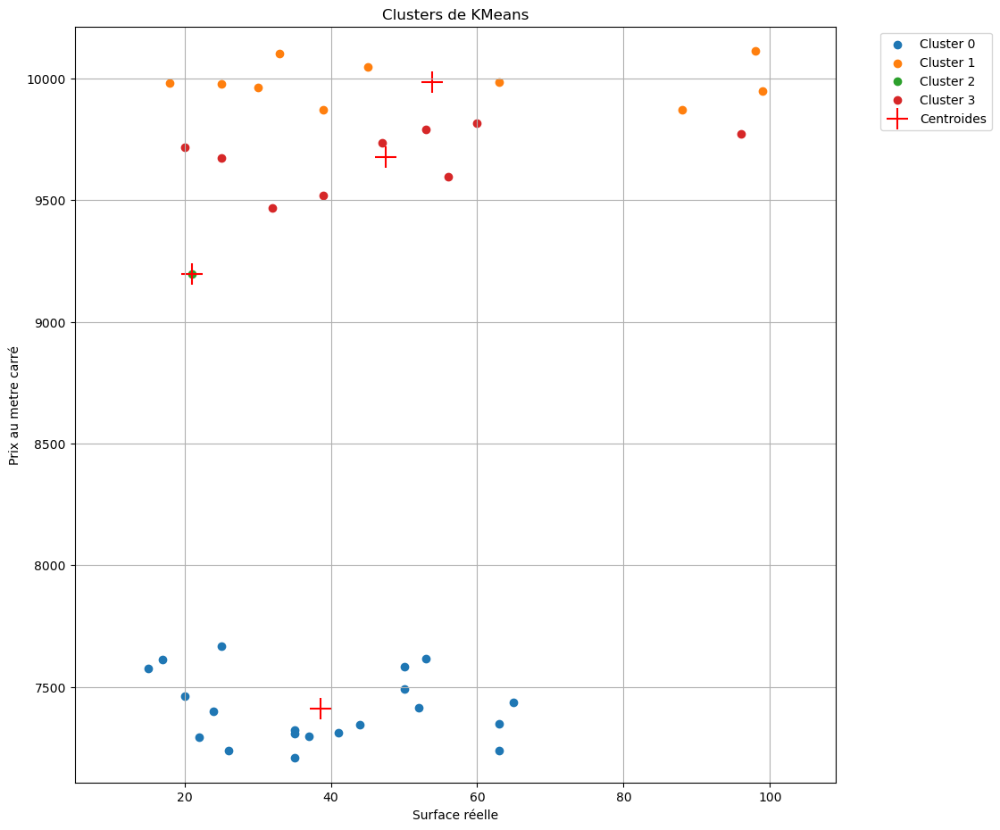

In [201]:
# Visualisation des clusters
plt.figure(figsize=(11, 11))

for cluster in range(k_means2.n_clusters):
    cluster_points2 = df_echantillon2[df_echantillon2['cluster'] == cluster]
    plt.scatter(cluster_points2['surface_reelle'], cluster_points2['prix_m2'], label=f'Cluster {cluster}')

# Affichage des centres des clusters
centroids2 = k_means2.cluster_centers_
surface_centroids2 = centroids2[:, 1]  # surface réelle
prix_m2_centroids2 = centroids2[:, 0]  # prix_m2 

plt.scatter(surface_centroids2, prix_m2_centroids2, s=300, c='red', marker='+', label='Centroides')

plt.xlabel("Surface réelle")
plt.ylabel("Prix au metre carré")

plt.xlim(df_echantillon2['surface_reelle'].min()-10,df_echantillon2['surface_reelle'].max()+10)
plt.ylim(df_echantillon2['prix_m2'].min()-100,df_echantillon2['prix_m2'].max()+100)

plt.grid(which='both')
plt.title("Clusters de KMeans")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Légende déportée pour lisibilité
plt.show()

In [202]:
from sklearn.metrics import silhouette_score

# Calcul du Silhouette Score
k_means_labels2 = k_means2.predict(X)  # Prédiction des clusters
silhouette2 = silhouette_score(X, k_means_labels2)
print(f"Silhouette Score : {silhouette2:.2f}")


Silhouette Score : 0.70


In [203]:
# On vérifie les données de la prédiction
k_means2.score(X)

print(f"Score : {k_means2.score(X):.2f}")

Score : -579720.03


In [204]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

k_accuracy2 = round(accuracy_score(df_echantillon2['cluster'],k_means_labels2),2)*100
k_confusion2 = confusion_matrix(df_echantillon2['cluster'],k_means_labels2)
                 
print(f"Précision : {k_accuracy2}%",)
print()
print(f"Matrice de confusion :\n {k_confusion2} ")

Précision : 100.0%

Matrice de confusion :
 [[20  0  0  0]
 [ 0 10  0  0]
 [ 0  0  1  0]
 [ 0  0  0  9]] 


# Milestone 5 - Analyse et présentation des résultats

Mes conclusions sur l'analyse et les limites de l'exercice :

- Les locaux ont une plus grande valorisation
- Le Score du modèle est très élevé R² = 98,36% mais cela pourrait indiquer un surajustement, ce qui pourrait biaiser les prédictions pour ce segment particulier.
- Un MAPE de 5.12% est globalement faible, mais il peut masquer les erreurs spécifiques à des segments précis comme les locaux industriels
- Les locaux industriels sont sous représentés dans les données transactions et devraient nécessité un rééchantillonnage.


Classification : 
- La classification permet de définir les types de biens pour le 19e arrondissement avec un taux de précision de 100% et un coefficient silhouette de 0.91 ainsi qu'avec une matrice de confusion permettant de définir de façon précise les différents types de bien
- Cependant ce résultat est à mettre au conditionnel compte tenu des différentes limites de la méthode, à savoir : la porositée des clusters, les outliers, le % d'erreur